In [5]:
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
import scipy as sp
import pandas as pd
import seaborn as sns
import os
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
#import umap
import glob
from sklearn.tree import DecisionTreeRegressor
from sklearn.feature_selection import SelectFromModel
from fcmeans import FCM
from sklearn.datasets import make_blobs
from matplotlib import pyplot as plt
from seaborn import scatterplot as scatter
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.mixture import GaussianMixture
from sklearn.preprocessing import MinMaxScaler

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal
from PyAstronomy import pyasl
from sklearn.metrics import mean_squared_error
from scipy.signal import savgol_filter
from sklearn import preprocessing, svm
from sklearn.model_selection import cross_validate
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression

#df0=pd.read_csv(r'D:\UserData\z0041t8e\Documents\Projects\3_TICO2\Compiled_Data\dataset0_smoothed.csv', sep=',',  index_col=0)
#df1=pd.read_csv(r'D:\UserData\z0041t8e\Documents\Projects\3_TICO2\Compiled_Data\dataset1_smoothed.csv', sep=',',  index_col=0)
#df2=pd.read_csv(r'D:\UserData\z0041t8e\Documents\Projects\3_TICO2\Compiled_Data\dataset2_smoothed.csv', sep=',',  index_col=0)
#df3=pd.read_csv(r'D:\UserData\z0041t8e\Documents\Projects\3_TICO2\Compiled_Data\dataset3_smoothed.csv', sep=',',  index_col=0)

#total_data_df = pd.concat([df0, df1, df2, df3], ignore_index=True)

df = pd.read_csv(r'df_with_freezed_clusters.csv', sep=',',  index_col=0)

In [32]:
df#.drop('Part','defect', 'defect_smoothed', 'max_ratio', 'min_ratio', 'cluster_label', axis=1)#.columns

,fDie1wflow_en0,fDie1wflow_en1,fDie1wflow_en2,fDie1wflow_en3,fDie1wflow_en4,fDie1wflow_mse,fDie1wflow_mae,fDie2wflow_en0,fDie2wflow_en1,fDie2wflow_en2,...,tiebar_en14,tiebar_en15,tiebar_mse,tiebar_mae,Part,defect,defect_smoothed,max_ratio,min_ratio,cluster_label
0,21.692999,0.759790,-0.968287,13.580341,-0.567633,0.002722,0.038137,9.908647,1.283877,-0.999141,...,-0.611454,-0.387602,0.002732,0.035002,B1012-278-1,0,0.000000,0.000000,0.000000,3
1,22.802261,1.165540,-0.969840,15.000215,-0.767543,0.002549,0.035166,9.719274,1.268317,-0.999214,...,-0.606745,-0.379443,0.002792,0.035812,B1012-278-1,0,0.000000,0.000000,0.000000,3
2,23.670288,1.490633,-0.969832,15.979490,-0.831797,0.002225,0.031885,9.586231,0.992506,-0.999257,...,-0.604088,-0.373460,0.002860,0.037235,B1012-278-1,0,0.000000,0.000000,0.000000,3
3,23.920792,2.118496,-0.968945,15.828067,-0.853646,0.001940,0.026800,9.413850,0.393041,-0.999068,...,-0.586925,-0.352818,0.002696,0.037237,B1012-278-1,0,0.000000,0.000000,0.000000,6
4,24.256344,2.081036,-0.970542,16.486008,-0.890179,0.001000,0.020291,9.127824,0.392960,-0.999210,...,-0.595761,-0.323802,0.002910,0.039074,B1012-278-1,0,0.000000,0.000000,0.000000,6
5,24.451166,2.219615,-0.977122,16.582668,-0.917516,0.001678,0.025937,9.019852,0.135056,-0.999159,...,-0.589153,-0.351843,0.002957,0.039640,B1012-278-1,0,0.000000,0.000000,0.000000,6
6,25.327190,2.288937,-0.979330,17.375237,-0.934043,0.001821,0.029028,8.904948,-0.033287,-0.999333,...,-0.590691,-0.337591,0.002905,0.039211,B1012-278-1,0,0.000000,0.000000,0.000000,6
7,26.121300,2.630819,-0.970186,17.716516,-0.909404,0.002732,0.034934,8.365232,-0.184044,-0.999282,...,-0.593010,-0.339744,0.002426,0.034152,B1012-278-1,0,0.000000,0.000000,0.000000,6
8,24.465048,2.394772,-0.977317,17.329178,-0.947928,0.001401,0.024786,8.130345,-0.143087,-0.999184,...,-0.591333,-0.355854,0.002780,0.037976,B1012-278-1,0,0.000000,0.000000,0.000000,6
9,25.383656,2.601822,-0.974734,17.313204,-0.932106,0.001824,0.030129,8.468645,-0.182594,-0.999270,...,-0.596701,-0.356185,0.002823,0.038464,B1012-278-1,0,0.000000,0.000000,0.000000,6


In [215]:
total_data_df.head()

,File_No,fDie1wflow_en0,fDie1wflow_en1,fDie1wflow_en2,fDie1wflow_en3,fDie1wflow_en4,fDie1wflow_mse,fDie1wflow_mae,fDie2wflow_en0,fDie2wflow_en1,...,Part,Die,Cast_date,Shift,Shot_no,dayOfWeek,cav1_defect,cav2_defect,defect,defect_smoothed
0,B1012-278-1AF10005,21.692999,0.759790,-0.968287,13.580341,-0.567633,0.002722,0.038137,9.908647,1.283877,...,B1012-278-1,1,2018-01-15,1,5,0,0,0,0,0.0
1,B1012-278-1AF10006,22.802261,1.165540,-0.969839,15.000215,-0.767543,0.002549,0.035166,9.719274,1.268317,...,B1012-278-1,1,2018-01-15,1,6,0,0,0,0,0.0
2,B1012-278-1AF10007,23.670288,1.490633,-0.969832,15.979490,-0.831797,0.002225,0.031885,9.586231,0.992506,...,B1012-278-1,1,2018-01-15,1,7,0,0,0,0,0.0
3,B1012-278-1AF10008,23.920792,2.118496,-0.968945,15.828067,-0.853646,0.001940,0.026800,9.413850,0.393041,...,B1012-278-1,1,2018-01-15,1,8,0,0,0,0,0.0
4,B1012-278-1AF10009,24.256344,2.081036,-0.970541,16.486008,-0.890179,0.001000,0.020291,9.127824,0.392960,...,B1012-278-1,1,2018-01-15,1,9,0,0,0,0,0.0


In [234]:
files_clusters #=pd.DataFrame(data=files_clusters.values, 
                                           #columns=['File_No', 'cluster_label'])
    
files_clusters.to_csv(r'files_clusters_map.csv')

In [4]:
#Fill nan values
np.unique(df.isnull().values)
#total_data_df.fillna(0,inplace=True)

array([False])

In [73]:
n_clusters_ = len(np.unique(df['cluster_label']))

In [5]:
df['Part'] = df['Part'].replace(df.Part.unique(), [1,2,3,4,5])
#feature and label creation
features_df = df.drop(['defect_smoothed','defect','Part', 'max_ratio', 'min_ratio', 'cluster_label'], axis=1)
#features_df = pd.get_dummies(features_df)
labels_df = df['defect']


#features_df.head()
#features_df.shape
#labels_df.shape
df


,fDie1wflow_en0,fDie1wflow_en1,fDie1wflow_en2,fDie1wflow_en3,fDie1wflow_en4,fDie1wflow_mse,fDie1wflow_mae,fDie2wflow_en0,fDie2wflow_en1,fDie2wflow_en2,...,tiebar_en14,tiebar_en15,tiebar_mse,tiebar_mae,Part,defect,defect_smoothed,max_ratio,min_ratio,cluster_label
0,21.692999,0.759790,-0.968287,13.580341,-0.567633,0.002722,0.038137,9.908647,1.283877,-0.999141,...,-0.611454,-0.387602,0.002732,0.035002,1,0,0.000000,0.000000,0.000000,3
1,22.802261,1.165540,-0.969840,15.000215,-0.767543,0.002549,0.035166,9.719274,1.268317,-0.999214,...,-0.606745,-0.379443,0.002792,0.035812,1,0,0.000000,0.000000,0.000000,3
2,23.670288,1.490633,-0.969832,15.979490,-0.831797,0.002225,0.031885,9.586231,0.992506,-0.999257,...,-0.604088,-0.373460,0.002860,0.037235,1,0,0.000000,0.000000,0.000000,3
3,23.920792,2.118496,-0.968945,15.828067,-0.853646,0.001940,0.026800,9.413850,0.393041,-0.999068,...,-0.586925,-0.352818,0.002696,0.037237,1,0,0.000000,0.000000,0.000000,6
4,24.256344,2.081036,-0.970542,16.486008,-0.890179,0.001000,0.020291,9.127824,0.392960,-0.999210,...,-0.595761,-0.323802,0.002910,0.039074,1,0,0.000000,0.000000,0.000000,6
5,24.451166,2.219615,-0.977122,16.582668,-0.917516,0.001678,0.025937,9.019852,0.135056,-0.999159,...,-0.589153,-0.351843,0.002957,0.039640,1,0,0.000000,0.000000,0.000000,6
6,25.327190,2.288937,-0.979330,17.375237,-0.934043,0.001821,0.029028,8.904948,-0.033287,-0.999333,...,-0.590691,-0.337591,0.002905,0.039211,1,0,0.000000,0.000000,0.000000,6
7,26.121300,2.630819,-0.970186,17.716516,-0.909404,0.002732,0.034934,8.365232,-0.184044,-0.999282,...,-0.593010,-0.339744,0.002426,0.034152,1,0,0.000000,0.000000,0.000000,6
8,24.465048,2.394772,-0.977317,17.329178,-0.947928,0.001401,0.024786,8.130345,-0.143087,-0.999184,...,-0.591333,-0.355854,0.002780,0.037976,1,0,0.000000,0.000000,0.000000,6
9,25.383656,2.601822,-0.974734,17.313204,-0.932106,0.001824,0.030129,8.468645,-0.182594,-0.999270,...,-0.596701,-0.356185,0.002823,0.038464,1,0,0.000000,0.000000,0.000000,6


In [6]:
scaler = StandardScaler()
scaled_features_arr = scaler.fit_transform(features_df)
#print(scaled_features.shape)
scaled_features = pd.DataFrame(data=scaled_features_arr, 
                                           columns=features_df.columns.values)
df_scaled = scaled_features
df_scaled['Part'] = df['Part'].replace(df.Part.unique(), [1,2,3,4,5])
#df_scaled['Part']=df['Part']
df_scaled['defect']=df['defect']
df_scaled['cluster_label']=df['cluster_label']
#df_scaled = pd.get_dummies(df_scaled)


In [7]:
df_scaled.head()

,fDie1wflow_en0,fDie1wflow_en1,fDie1wflow_en2,fDie1wflow_en3,fDie1wflow_en4,fDie1wflow_mse,fDie1wflow_mae,fDie2wflow_en0,fDie2wflow_en1,fDie2wflow_en2,...,tiebar_en11,tiebar_en12,tiebar_en13,tiebar_en14,tiebar_en15,tiebar_mse,tiebar_mae,Part,defect,cluster_label
0,0.287420,-1.984405,-0.176543,0.781733,-0.958545,-0.032222,0.274246,1.849172,0.467022,-1.385980,...,0.265524,0.478632,-0.165832,-0.262346,0.498165,-0.266214,-1.072165,1,0,3
1,0.464678,-1.890963,-0.177172,0.905691,-1.037891,-0.033001,0.239322,1.793847,0.463315,-1.386016,...,0.263579,0.471968,-0.127239,-0.247158,0.547075,-0.260516,-1.001860,1,0,3
2,0.603388,-1.816096,-0.177169,0.991184,-1.063394,-0.034464,0.200761,1.754978,0.397607,-1.386038,...,0.304351,0.472617,-0.110410,-0.238588,0.582942,-0.253929,-0.878400,1,0,3
3,0.643418,-1.671504,-0.176810,0.977965,-1.072066,-0.035754,0.141008,1.704617,0.254794,-1.385944,...,0.229353,0.385406,-0.023730,-0.183229,0.706678,-0.269681,-0.878216,1,0,6
4,0.697039,-1.680131,-0.177457,1.035404,-1.086567,-0.039995,0.064509,1.621054,0.254774,-1.386014,...,0.317642,0.424669,0.099562,-0.211728,0.880619,-0.249168,-0.718728,1,0,6


<IPython.core.display.Javascript object>


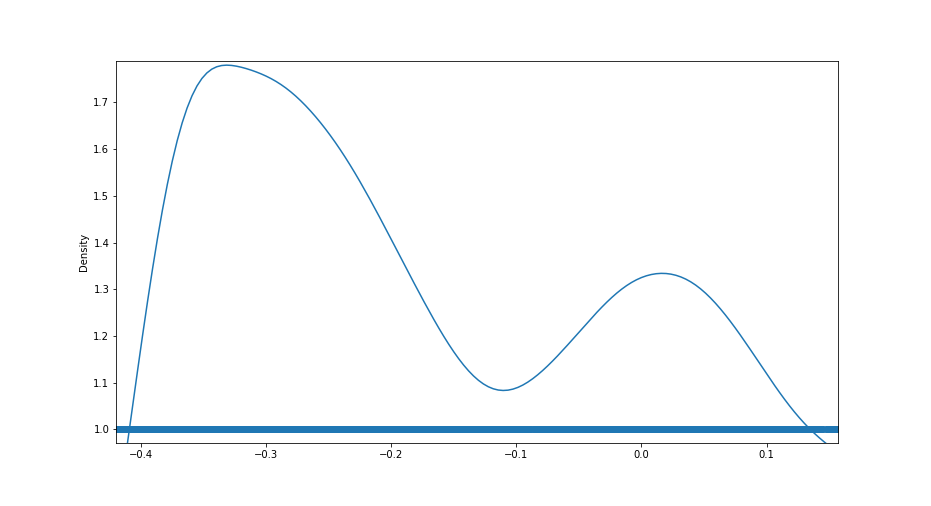

In [9]:
%matplotlib notebook
%matplotlib notebook
#%matplotlib inline


plt.figure(1)
#plt.plot(df['fDie1wflow_mse'], total_data_df['defect'],'r--')
plt.scatter(df['core3_en29'], df['defect'])#, s=area, c=colors, alpha=0.5)
ax = df['core3_en29'].plot.kde()
#plt.xlim(-5, 27)
plt.show()
plt.show()

In [10]:
df.groupby(df.defect).cluster_label.value_counts()

defect  cluster_label
0       0                32837
        2                28036
        4                15388
        5                 9074
        6                 8714
        7                 7133
        1                 2201
        3                 1581
1       4                  784
        2                  652
        0                  521
        5                  226
        6                  213
        7                  187
        3                   22
Name: cluster_label, dtype: int64

In [2]:
#groupby based on gmm labels(cluster output label,new_data is a list with 7 groups)
gb = df.groupby('cluster_label')    
new_data=[gb.get_group(x) for x in gb.groups]

In [3]:
data_label_0=new_data[0]
data_label_1=new_data[1]
data_label_2=new_data[2]
data_label_3=new_data[3]
data_label_4=new_data[4]
data_label_5=new_data[5]
data_label_6=new_data[6]
data_label_7=new_data[7]

In [6]:
scaler =MinMaxScaler()
#caled_features = scaler.fit_transform(features_df)

#convert lists into seven dataframes
data_0 = scaler.fit_transform(pd.DataFrame(data_label_0.drop(['defect_smoothed','Part', 'max_ratio', 'min_ratio', 'cluster_label'], axis=1)))
data_1 = scaler.fit_transform(pd.DataFrame(data_label_1.drop(['defect_smoothed','Part', 'max_ratio', 'min_ratio', 'cluster_label'], axis=1)))
data_2 = scaler.fit_transform(pd.DataFrame(data_label_2.drop(['defect_smoothed','Part', 'max_ratio', 'min_ratio', 'cluster_label'], axis=1)))
data_3 = scaler.fit_transform(pd.DataFrame(data_label_3.drop(['defect_smoothed','Part', 'max_ratio', 'min_ratio', 'cluster_label'], axis=1)))
data_4 = scaler.fit_transform(pd.DataFrame(data_label_4.drop(['defect_smoothed','Part', 'max_ratio', 'min_ratio', 'cluster_label'], axis=1)))
data_5 = scaler.fit_transform(pd.DataFrame(data_label_5.drop(['defect_smoothed','Part', 'max_ratio', 'min_ratio', 'cluster_label'], axis=1)))
data_6 = scaler.fit_transform(pd.DataFrame(data_label_6.drop(['defect_smoothed','Part', 'max_ratio', 'min_ratio', 'cluster_label'], axis=1)))
data_7 = scaler.fit_transform(pd.DataFrame(data_label_7.drop(['defect_smoothed','Part', 'max_ratio', 'min_ratio', 'cluster_label'], axis=1)))

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)
C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)
C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)
C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)
C:\Users\z0041t8e\AppDat

In [7]:
data_0_scaled = pd.DataFrame(data=data_0, 
                                           columns=df.drop(['defect_smoothed', 'max_ratio', 'min_ratio','Part', 'cluster_label'], axis=1).columns.values)
data_1_scaled = pd.DataFrame(data=data_1, 
                                           columns=df.drop(['defect_smoothed', 'max_ratio', 'min_ratio','Part', 'cluster_label'], axis=1).columns.values)
data_2_scaled = pd.DataFrame(data=data_2, 
                                           columns=df.drop(['defect_smoothed', 'max_ratio', 'min_ratio','Part', 'cluster_label'], axis=1).columns.values)
data_3_scaled = pd.DataFrame(data=data_3, 
                                           columns=df.drop(['defect_smoothed', 'max_ratio', 'min_ratio','Part', 'cluster_label'], axis=1).columns.values)
data_4_scaled = pd.DataFrame(data=data_4, 
                                           columns=df.drop(['defect_smoothed', 'max_ratio', 'min_ratio','Part', 'cluster_label'], axis=1).columns.values)
data_5_scaled = pd.DataFrame(data=data_5, 
                                           columns=df.drop(['defect_smoothed', 'max_ratio', 'min_ratio','Part', 'cluster_label'], axis=1).columns.values)
data_6_scaled = pd.DataFrame(data=data_6, 
                                           columns=df.drop(['defect_smoothed', 'max_ratio', 'min_ratio','Part', 'cluster_label'], axis=1).columns.values)
data_7_scaled = pd.DataFrame(data=data_7, 
                                           columns=df.drop(['defect_smoothed', 'max_ratio', 'min_ratio','Part', 'cluster_label'], axis=1).columns.values)

In [8]:
data_0_scaled['Part'] = data_label_0.Part.values
data_0_scaled['cluster_label'] = data_label_0.cluster_label.values

data_1_scaled['Part'] = data_label_1.Part.values
data_1_scaled['cluster_label'] = data_label_1.cluster_label.values

data_2_scaled['Part'] = data_label_2.Part.values
data_2_scaled['cluster_label'] = data_label_2.cluster_label.values

data_3_scaled['Part'] = data_label_3.Part.values
data_3_scaled['cluster_label'] = data_label_3.cluster_label.values

data_4_scaled['Part'] = data_label_4.Part.values
data_4_scaled['cluster_label'] = data_label_4.cluster_label.values

data_5_scaled['Part'] = data_label_5.Part.values
data_5_scaled['cluster_label'] = data_label_5.cluster_label.values

data_6_scaled['Part'] = data_label_6.Part.values
data_6_scaled['cluster_label'] = data_label_6.cluster_label.values

data_7_scaled['Part'] = data_label_7.Part.values
data_7_scaled['cluster_label'] = data_label_7.cluster_label.values


In [21]:
def plot_target(df, x=0, y=1, target='defect'):
    sub_df0 = df[df[target] == 0]
    sub_df1 = df[df[target] == 1]
    data = (sub_df0, sub_df1)
    colors = ('C0', 'C1')
    group = ('good', 'defect')
    # create plot
    fig, ax = plt.subplots(1,1, figsize=(12,12))
    for data_df, color, group in zip(data, colors, group):
        x_data = data_df.iloc[:, x].values
        y_data = data_df.iloc[:, y].values
        ax.scatter(x_data, y_data, alpha=0.5, c=color, s=20, label=group)
        
    plt.title(target+' distribution')
    plt.legend(loc='best')

#äplot_targets(data_5)

In [22]:
def plot_targets(df, x=0, y=1, target='Part'):
    sub_df0 = df[df[target] == 1 ]#'B1012-278-1']
    sub_df1 = df[df[target] == 2 ]#'B1022-278-1']
    sub_df2 = df[df[target] == 3 ]#'B1012-278-3']
    sub_df3 = df[df[target] == 4 ]#'B1012-278-4']
    sub_df4 = df[df[target] == 5 ]#'B1012-278-2']
    
    data = (sub_df0, sub_df1, sub_df2, sub_df3,sub_df4)
    colors = ('C0', 'C1', 'C2','C3','C4')
    group = ('B1012-278-1', 'B1022-278-1', 'B1012-278-3', 'B1012-278-4',
       'B1012-278-2')
    # create plot
    fig, ax = plt.subplots(1,1, figsize=(12,12))
    for data_df, color, group in zip(data, colors, group):
        x_data = data_df.iloc[:, x].values
        y_data = data_df.iloc[:, y].values
        ax.scatter(x_data, y_data, alpha=0.5, c=color, s=20, label=group)
        
    plt.title(target+' distribution')
    plt.legend(loc='best')

#plot_targets(data_5)

<IPython.core.display.Javascript object>


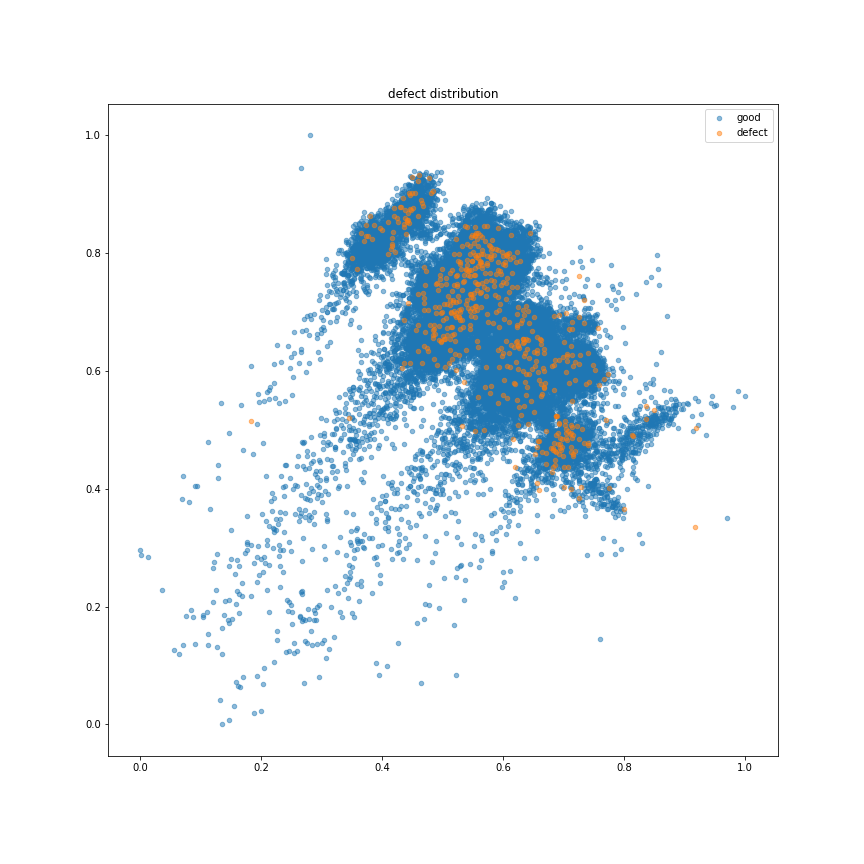

In [53]:
plot_target(data_0_scaled)

<IPython.core.display.Javascript object>


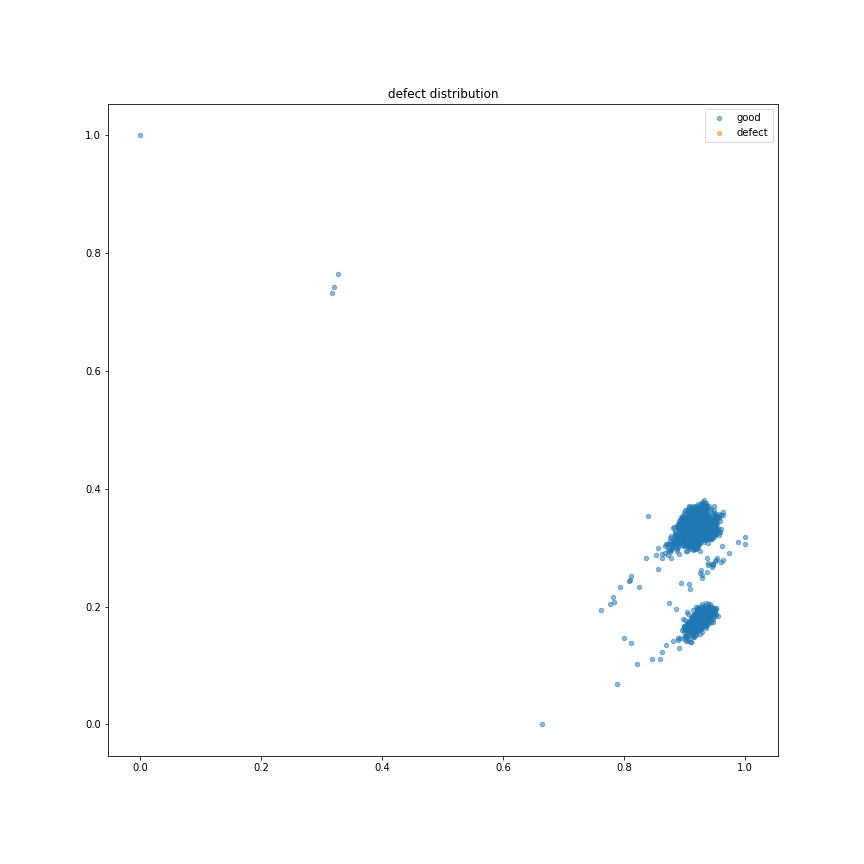

In [52]:
plot_target(data_1_scaled)

<IPython.core.display.Javascript object>


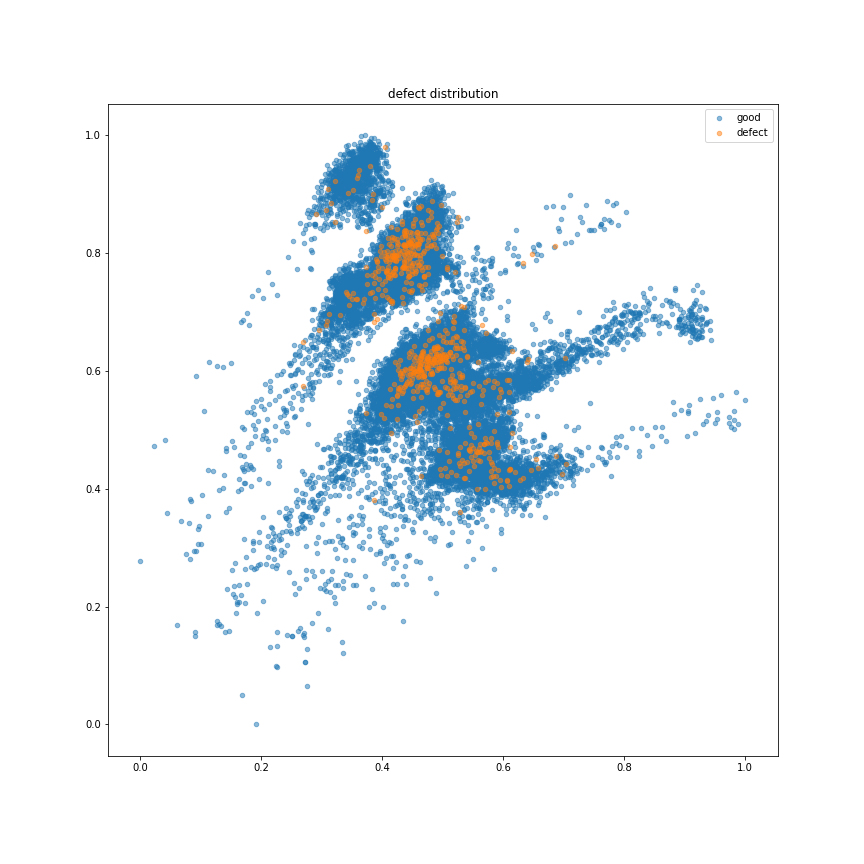

In [54]:
plot_target(data_2_scaled)

<IPython.core.display.Javascript object>


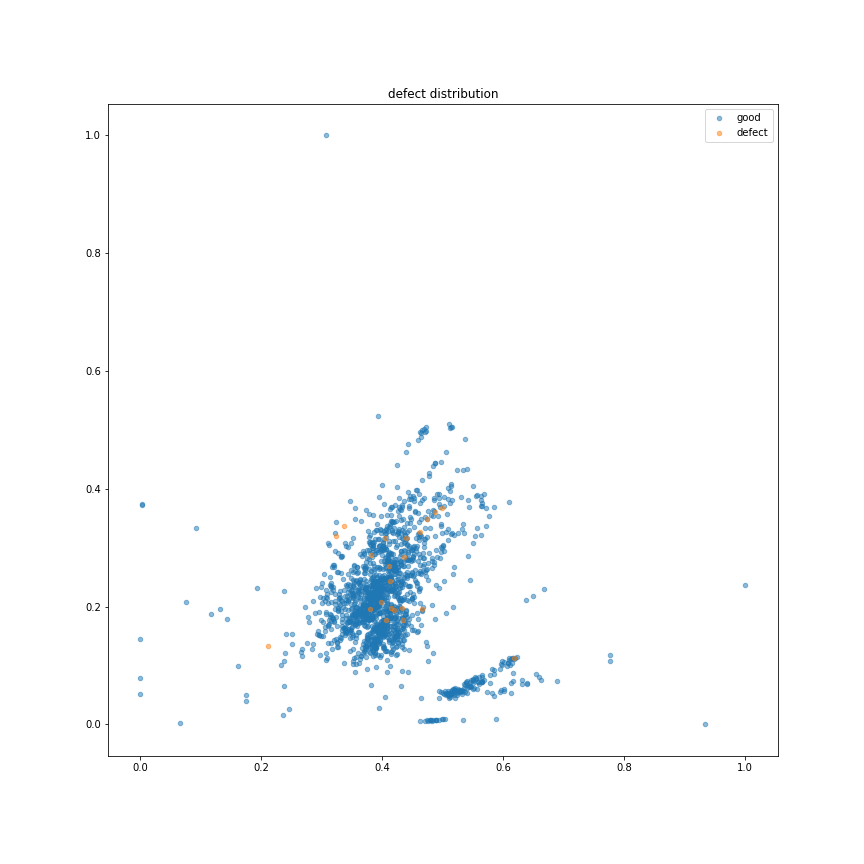

In [55]:
plot_target(data_3_scaled)

<IPython.core.display.Javascript object>


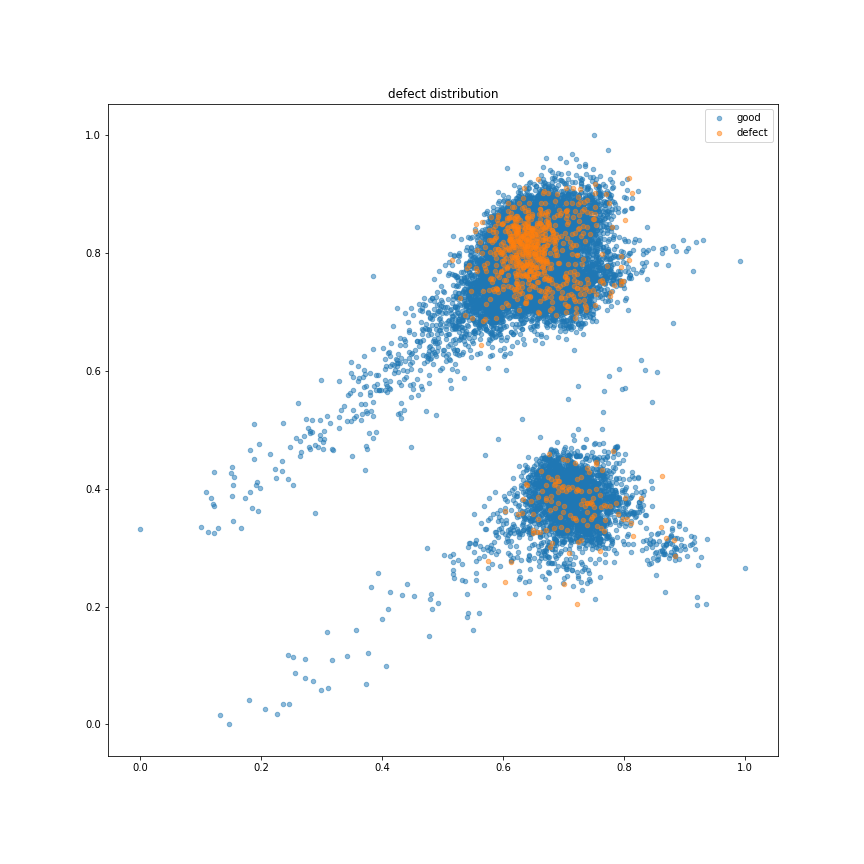

In [56]:
plot_target(data_4_scaled)

<IPython.core.display.Javascript object>


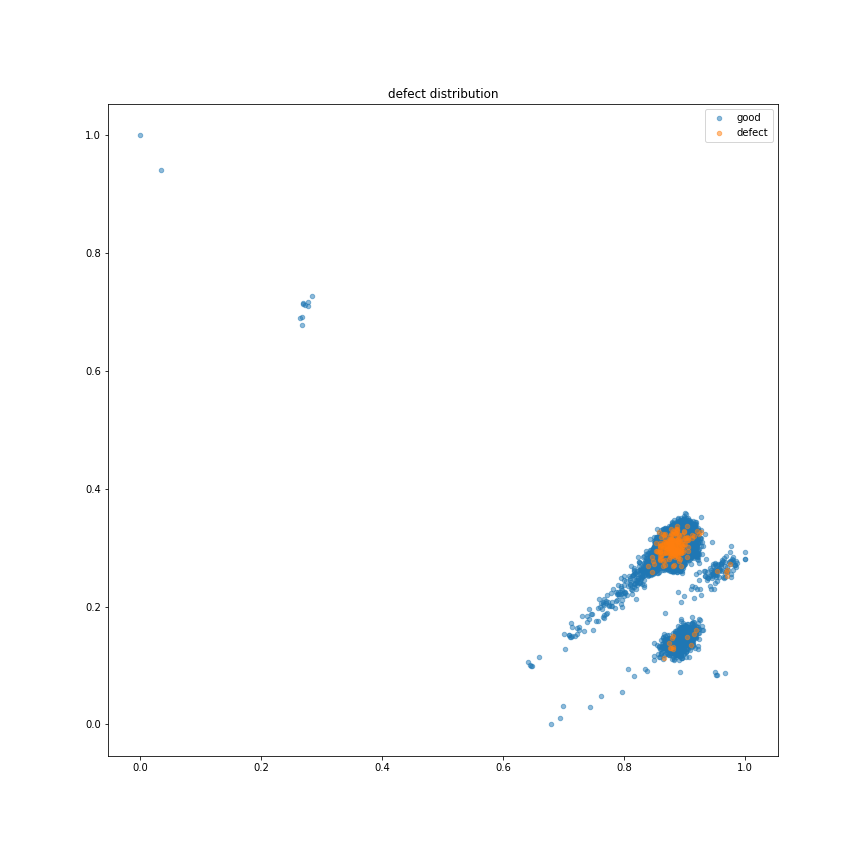

In [57]:
plot_target(data_5_scaled)

<IPython.core.display.Javascript object>


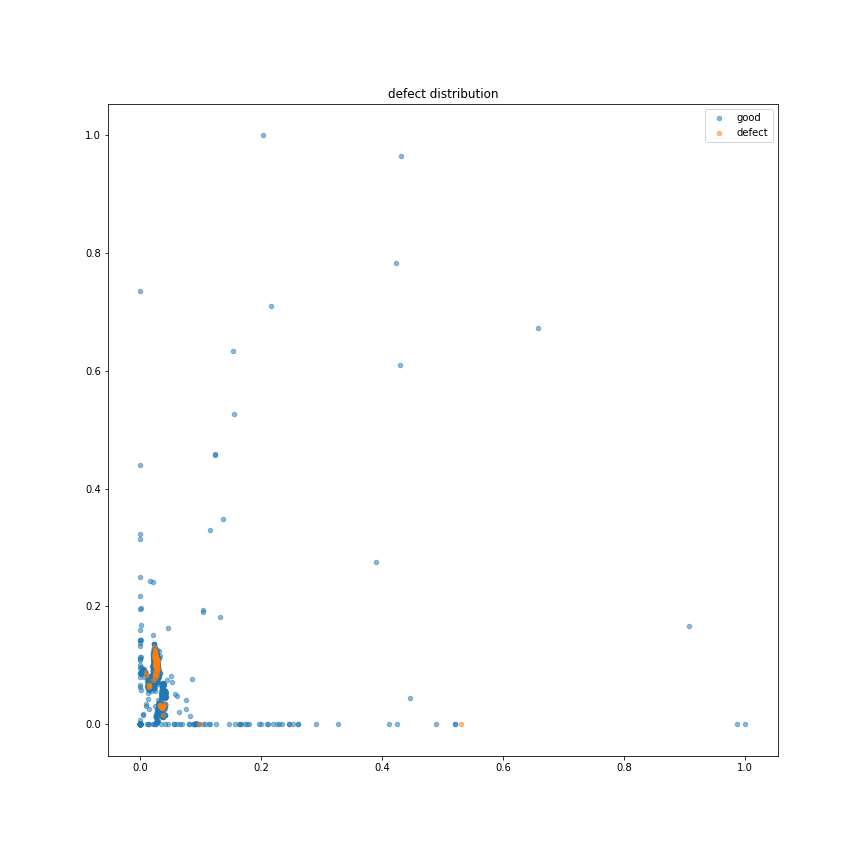

In [58]:
plot_target(data_6_scaled)

<IPython.core.display.Javascript object>


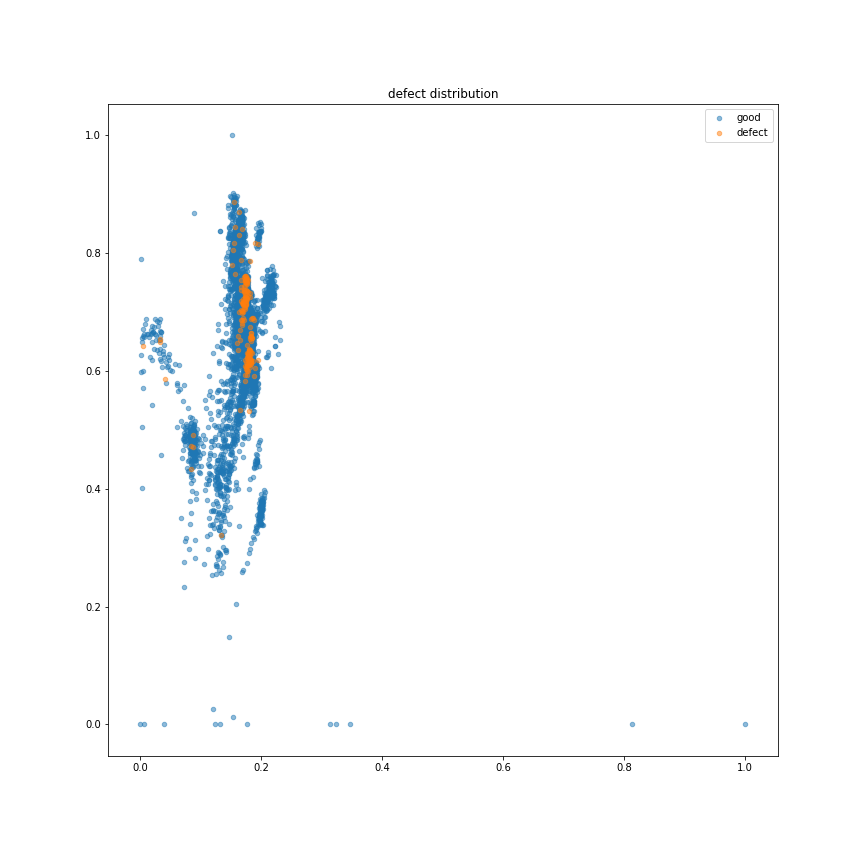

In [59]:
plot_target(data_7_scaled)

In [9]:
std_feats_0 = data_0_scaled.drop(['Part', 'cluster_label'], axis=1).std()
std_feats_1 = data_1_scaled.drop(['Part', 'cluster_label'], axis=1).std()
std_feats_2 = data_2_scaled.drop(['Part', 'cluster_label'], axis=1).std()
std_feats_3 = data_3_scaled.drop(['Part', 'cluster_label'], axis=1).std()
std_feats_4 = data_4_scaled.drop(['Part', 'cluster_label'], axis=1).std()
std_feats_5 = data_5_scaled.drop(['Part', 'cluster_label'], axis=1).std()
std_feats_6 = data_6_scaled.drop(['Part', 'cluster_label'], axis=1).std()
std_feats_7 = data_7_scaled.drop(['Part', 'cluster_label'], axis=1).std()


<IPython.core.display.Javascript object>


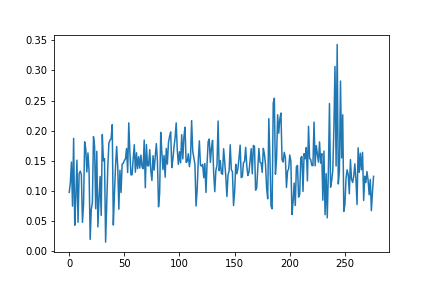

In [30]:
plt.figure(20)
#plt.hist(std_feats_0)
plt.plot(std_feats_0.values)
plt.show()

<IPython.core.display.Javascript object>


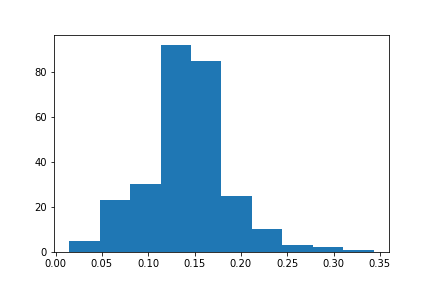

In [25]:
plt.figure(21)
plt.hist(std_feats_0)
#plt.plot(std_feats_0.values)
plt.show()

<IPython.core.display.Javascript object>


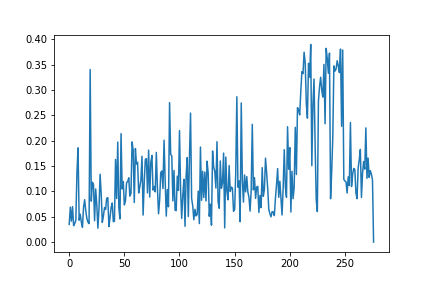

In [34]:
plt.figure(22)
#plt.hist(std_feats_0)
plt.plot(std_feats_1.values)
plt.show()

<IPython.core.display.Javascript object>


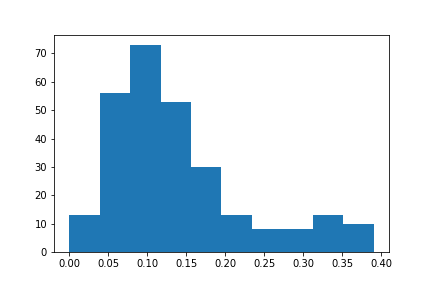

In [35]:
plt.figure(23)
plt.hist(std_feats_1)
#plt.plot(std_feats_0.values)
plt.show()

<IPython.core.display.Javascript object>


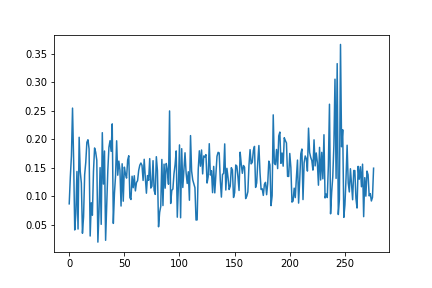

In [36]:
plt.figure(24)
#plt.hist(std_feats_0)
plt.plot(std_feats_2.values)
plt.show()

<IPython.core.display.Javascript object>


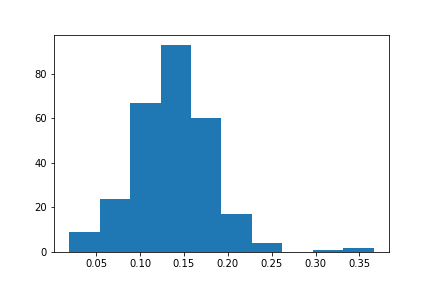

In [37]:
plt.figure(25)
plt.hist(std_feats_2)
#plt.plot(std_feats_0.values)
plt.show()

<IPython.core.display.Javascript object>


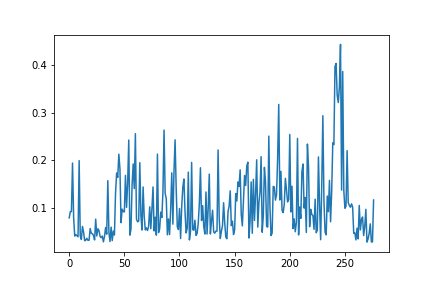

In [38]:
plt.figure(26)
#plt.hist(std_feats_0)
plt.plot(std_feats_3.values)
plt.show()

<IPython.core.display.Javascript object>


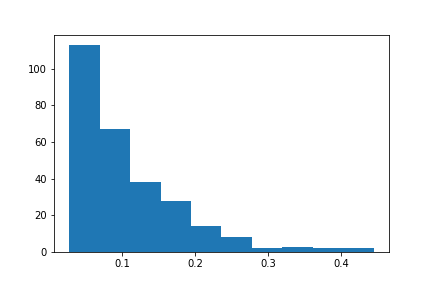

In [39]:
plt.figure(27)
plt.hist(std_feats_3)
#plt.plot(std_feats_0.values)
plt.show()

<IPython.core.display.Javascript object>


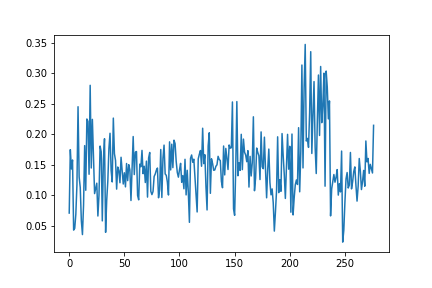

In [40]:
plt.figure(28)
#plt.hist(std_feats_0)
plt.plot(std_feats_4.values)
plt.show()

<IPython.core.display.Javascript object>


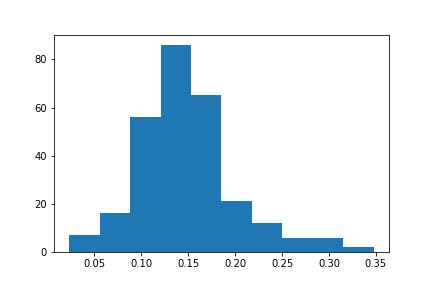

In [41]:
plt.figure(29)
plt.hist(std_feats_4)
#plt.plot(std_feats_0.values)
plt.show()

<IPython.core.display.Javascript object>


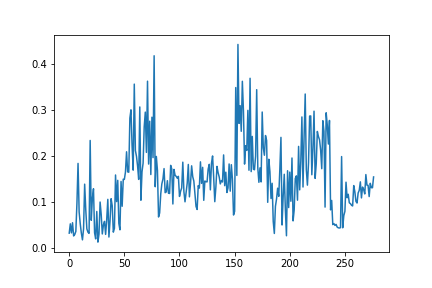

In [42]:
plt.figure(30)
#plt.hist(std_feats_0)
plt.plot(std_feats_5.values)
plt.show()

<IPython.core.display.Javascript object>


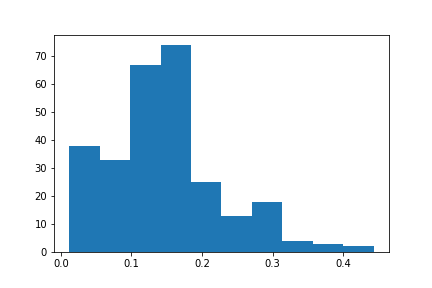

In [43]:
plt.figure(31)
plt.hist(std_feats_5)
#plt.plot(std_feats_0.values)
plt.show()

<IPython.core.display.Javascript object>


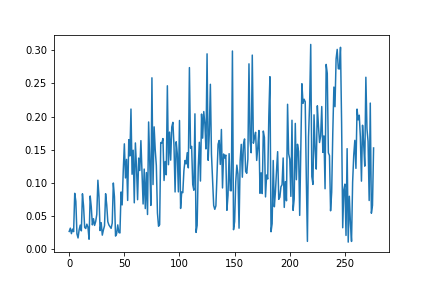

In [44]:
plt.figure(32)
#plt.hist(std_feats_0)
plt.plot(std_feats_6.values)
plt.show()

<IPython.core.display.Javascript object>


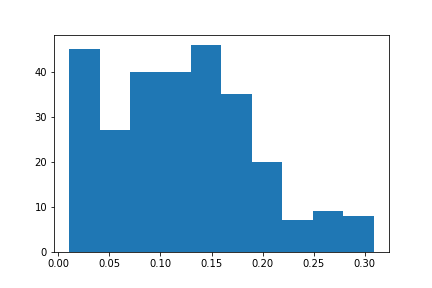

In [45]:
plt.figure(33)
plt.hist(std_feats_6)
#plt.plot(std_feats_0.values)
plt.show()

<IPython.core.display.Javascript object>


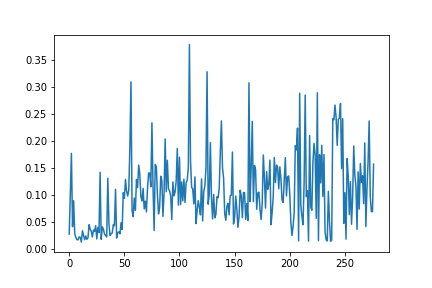

In [46]:
plt.figure(34)
#plt.hist(std_feats_0)
plt.plot(std_feats_7.values)
plt.show()

<IPython.core.display.Javascript object>


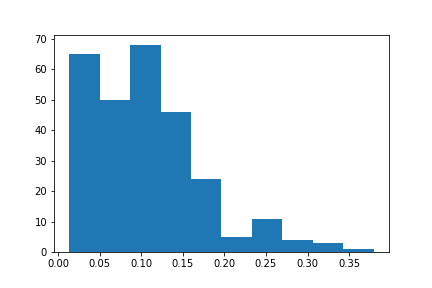

In [47]:
plt.figure(35)
plt.hist(std_feats_7)
#plt.plot(std_feats_0.values)

plt.show()

In [10]:
th = 0.083492
#th = 0.09

std_ftr_0 = np.asarray(std_feats_0.index.values[np.asarray(np.where(std_feats_0<th))][0])
std_ftr_1 = np.asarray(std_feats_1.index.values[np.asarray(np.where(std_feats_1<th))][0])
std_ftr_2 = np.asarray(std_feats_2.index.values[np.asarray(np.where(std_feats_2<th))][0])
std_ftr_3 = np.asarray(std_feats_3.index.values[np.asarray(np.where(std_feats_3<th))][0])
std_ftr_4 = np.asarray(std_feats_4.index.values[np.asarray(np.where(std_feats_4<th))][0])
std_ftr_5 = np.asarray(std_feats_5.index.values[np.asarray(np.where(std_feats_5<th))][0])
std_ftr_6 = np.asarray(std_feats_6.index.values[np.asarray(np.where(std_feats_6<th))][0])
std_ftr_7 = np.asarray(std_feats_7.index.values[np.asarray(np.where(std_feats_7<th))][0])
common_ftrs = np.intersect1d(std_ftr_0, np.intersect1d(std_ftr_1, np.intersect1d(std_ftr_2, np.intersect1d(std_ftr_3, np.intersect1d(std_ftr_4, np.intersect1d(std_ftr_5, np.intersect1d(std_ftr_6, std_ftr_7)))))))
print(common_ftrs)

[]


In [12]:
from functools import reduce
d = [std_ftr_0,
     std_ftr_1,
     std_ftr_2,
     std_ftr_3,
     std_ftr_4,
     std_ftr_5,
     std_ftr_6,
     std_ftr_7,]
#list(reduce(set.intersection, [set(item) for item in d ]))
#sym_diff = list(reduce(set.symmetric_difference, [set(item) for item in d ]))
#len(list(reduce(set.union, [set(item) for item in d ])))

n_clusters_=8

cmn_ftrs = [[]] * 8
for i in range(n_clusters_):
    for u in range(n_clusters_):
        if (i != u):
            cmn_ftrs[i] = np.union1d(cmn_ftrs[i], np.intersect1d(d[i], d[u]))     

#uniq_ftrs = d
#for i in range(n_clusters_):
#    uniq_ftrs[i] = np.intersect1d(d[i], sym_diff)


In [26]:
#d[0].shape

np.savetxt("ftrs_7.csv", np.asarray(d[7]), fmt='%s', delimiter=",")

[33358, 2201, 28688, 1603, 16172, 9300, 8927, 7320]
[29, 80, 26, 136, 21, 58, 87, 109]
[1.56, 0.0, 2.27, 1.37, 4.85, 2.43, 2.39, 2.55]


<IPython.core.display.Javascript object>


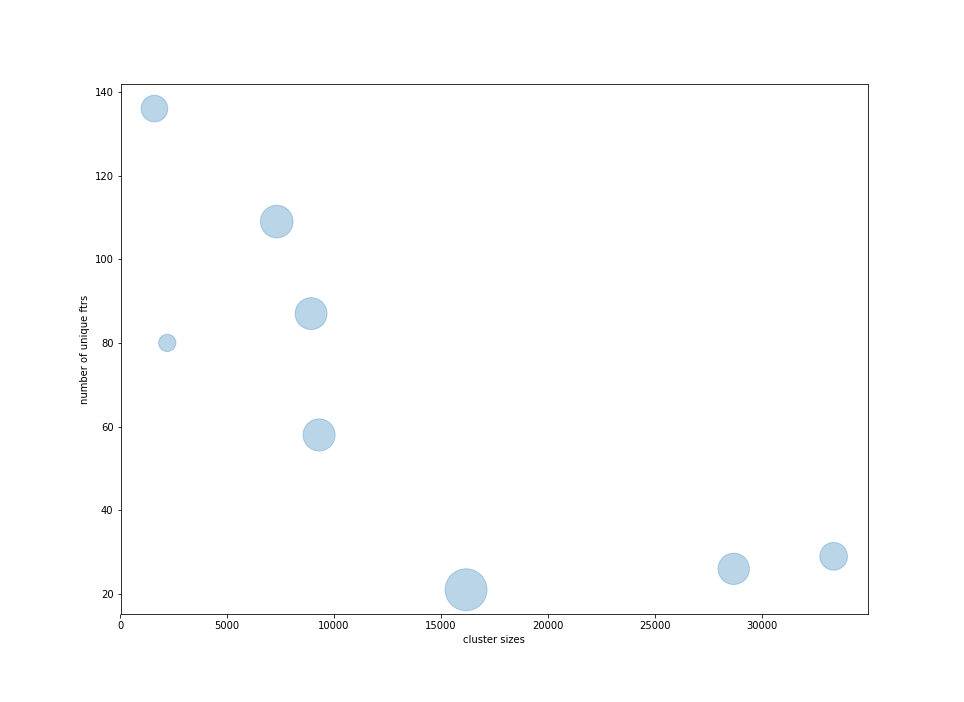

Text(0, 0.5, 'number of unique ftrs')

In [132]:
cluster_sizes = [0 for x in range(n_clusters_)]
for i in range(n_clusters_):
    temp_df = df[ (df['cluster_label']==float(i)) ]
    cluster_sizes[i] = len(temp_df)
    
print(cluster_sizes)
print(n_uniq_ftrs)
print(defect_rates)




n_uniq_ftrs = [0 for x in range(n_clusters_)]
n_uniq_ftrs[0] = len(std_ftr_0)
n_uniq_ftrs[1] = len(std_ftr_1)
n_uniq_ftrs[2] = len(std_ftr_2)
n_uniq_ftrs[3] = len(std_ftr_3)
n_uniq_ftrs[4] = len(std_ftr_4)
n_uniq_ftrs[5] = len(std_ftr_5)
n_uniq_ftrs[6] = len(std_ftr_6)
n_uniq_ftrs[7] = len(std_ftr_7)


plt.figure(300)
#plt.scatter(cluster_sizes, n_uniq_ftrs)
plt.scatter(cluster_sizes, n_uniq_ftrs, s=(np.asarray(defect_rates)+1)*300, alpha=0.3,
            cmap='viridis')
plt.xlabel('cluster sizes')
plt.ylabel('number of unique ftrs')


In [133]:
np.sum([n_uniq_ftrs])

546

In [53]:
B = 0.001
std_ftr_0_close_to_defect = np.asarray(std_feats_0.index.values[np.asarray(np.where(abs(std_feats_0-std_feats_0['defect'])<B))][0])

print(std_ftr_0_close_to_defect)

['mDie3wflow_en0' 'core5_en25' 'core6_en6' 'tiebar_en0' 'tiebar_en10'
 'defect']


In [31]:
def vis_high_std_ftrs(df, ftrs, y, plot_n):
    n_plots = len(ftrs)
    print('number of features with high standard diviation:', len(ftrs))
    for i in range(n_plots):
        plt.figure(plot_n+i)
        plt.scatter(df[ftrs[i]], df[y])#, s=area, c=colors, alpha=0.5)
        ax = df[ftrs[i]].plot.kde()
        plt.xlim(-0.25,1.1)
        plt.show()

number of features with high standard diviation: 29


C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


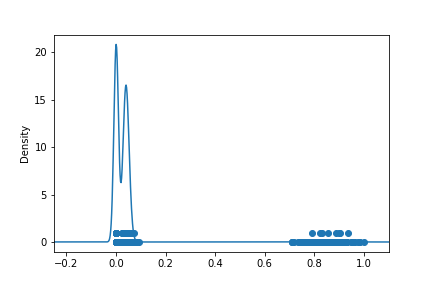

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


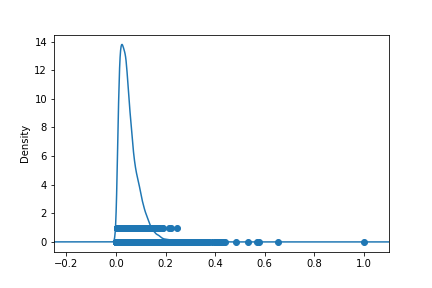

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


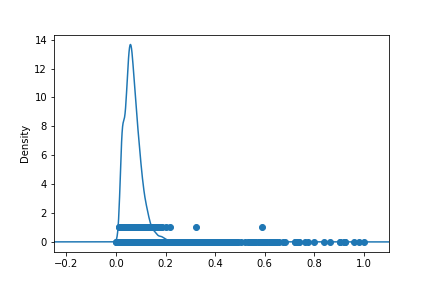

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


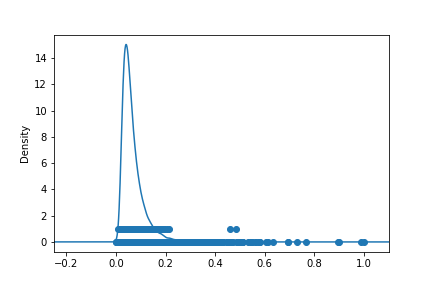

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


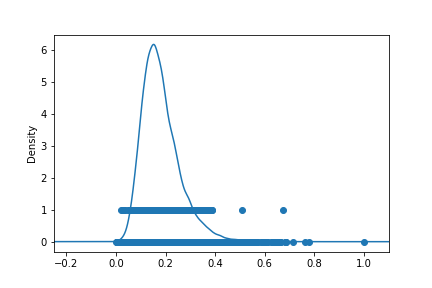

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


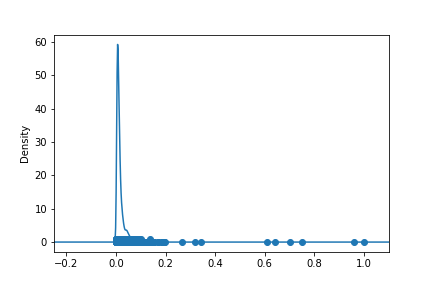

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


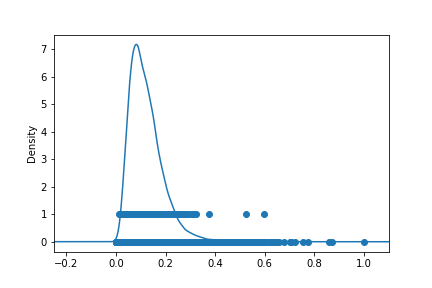

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


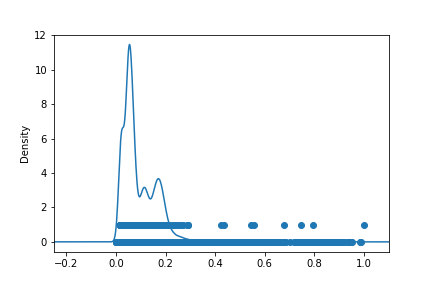

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


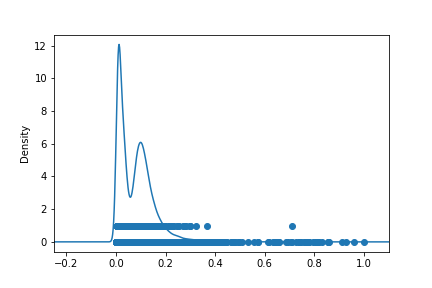

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


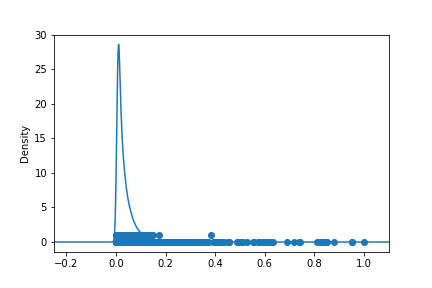

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


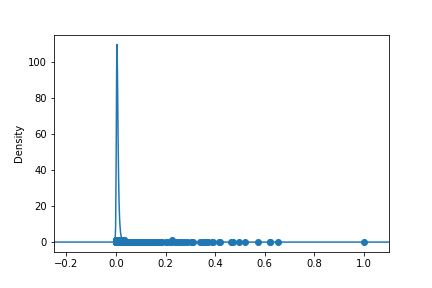

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


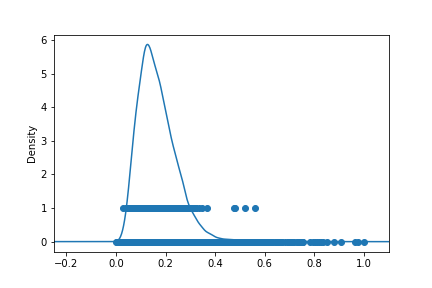

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


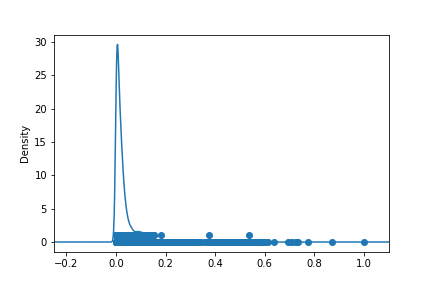

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


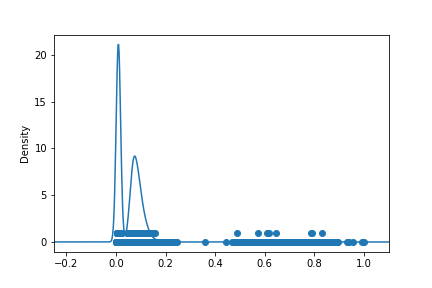

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


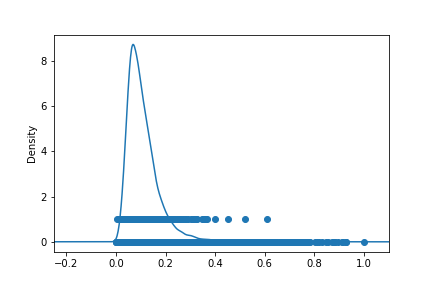

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


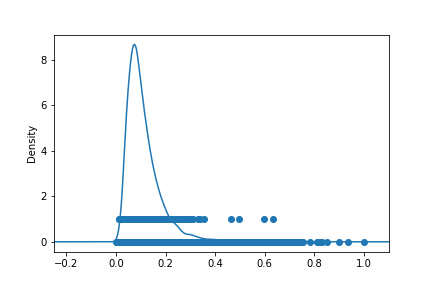

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


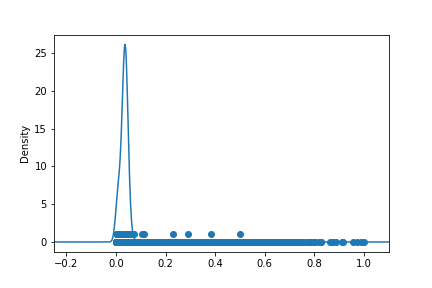

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


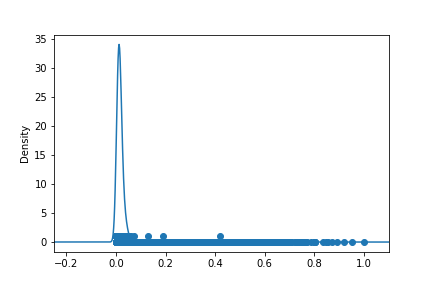

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


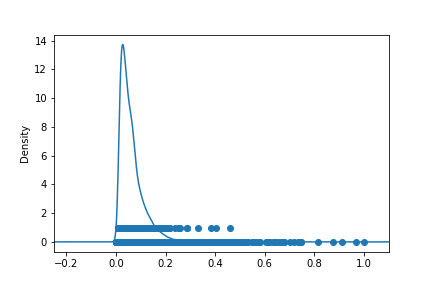

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


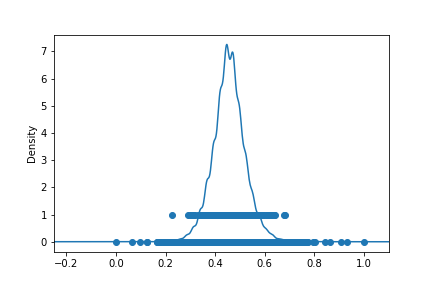

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


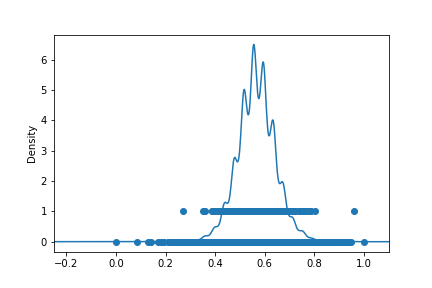

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


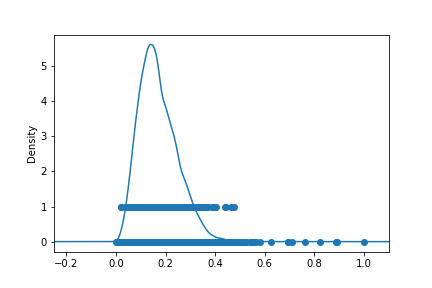

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


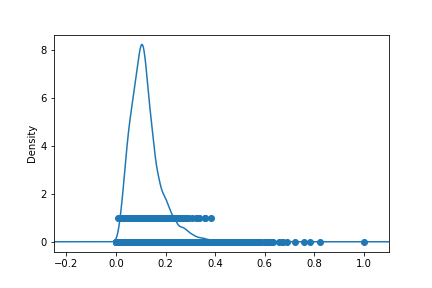

In [254]:
vis_high_std_ftrs(data_0_scaled, high_std_ftr_0, 'defect', 100)

number of features with high standard diviation: 79


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


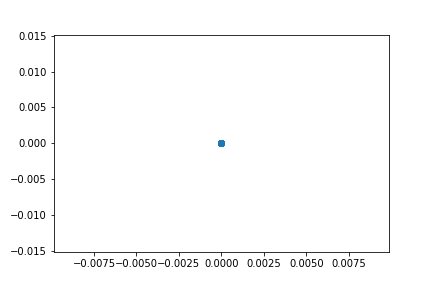

LinAlgError: singular matrix

In [64]:
vis_high_std_ftrs(data_1_scaled, high_std_ftr_1, 'defect', 210)

number of features with high standard diviation: 2


C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


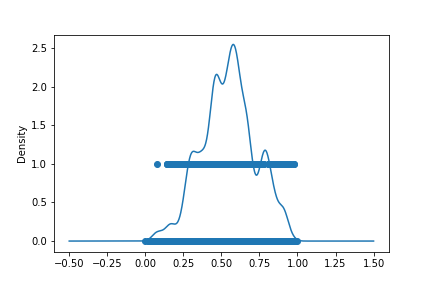

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


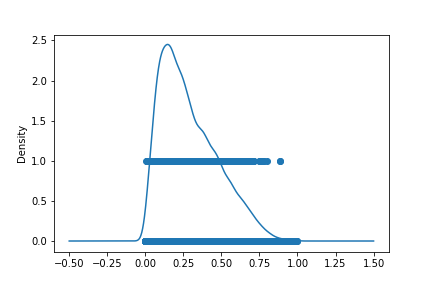

In [226]:
vis_high_std_ftrs(data_2_scaled, high_std_ftr_0, 'defect', 140)

number of features with high standard diviation: 2


C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


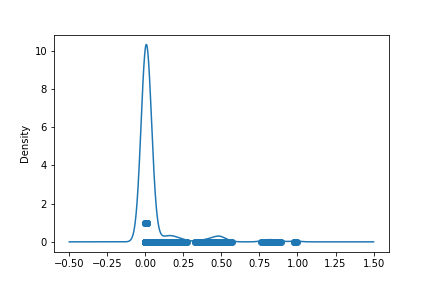

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


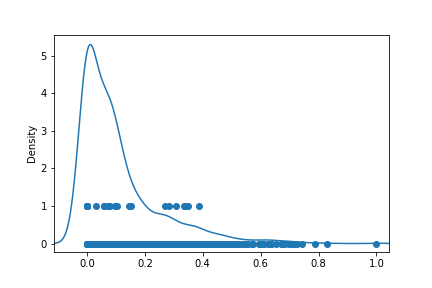

In [227]:
vis_high_std_ftrs(data_3_scaled, high_std_ftr_0, 'defect', 150)

number of features with high standard diviation: 2


C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


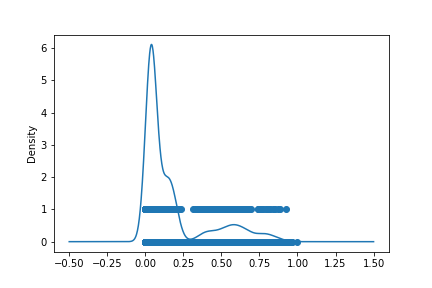

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


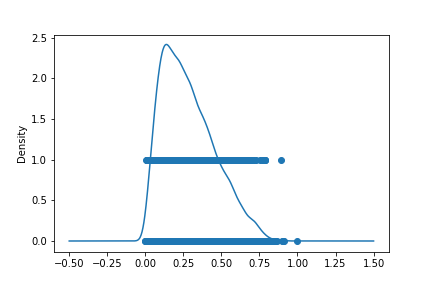

In [228]:
vis_high_std_ftrs(data_4_scaled, high_std_ftr_0, 'defect', 160)

number of features with high standard diviation: 2


C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


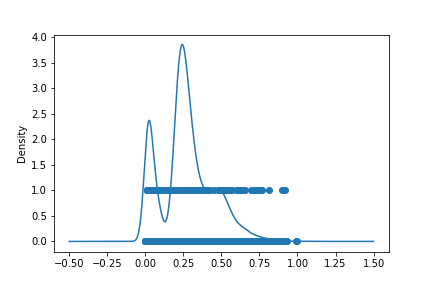

C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


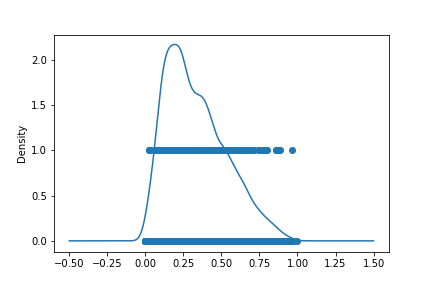

In [229]:
vis_high_std_ftrs(data_5_scaled, high_std_ftr_0, 'defect', 170)

number of features with high standard diviation: 1


C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


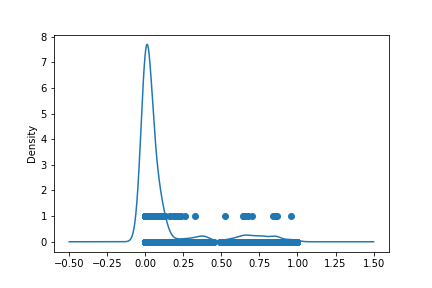

In [217]:
vis_high_std_ftrs(data_6_scaled, common_ftrs, 'defect', 190)

number of features with high standard diviation: 1


C:\Users\z0041t8e\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


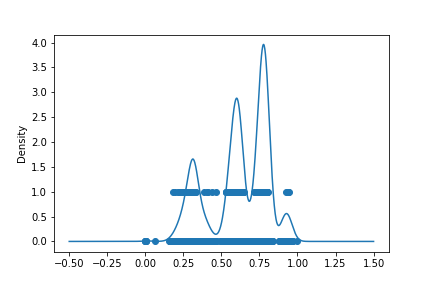

In [218]:
vis_high_std_ftrs(data_7_scaled, common_ftrs, 'defect', 200)

In [ ]:
most common low std feature is: 'fDie2wflow_mse' with th=0.0835

In [ ]:
most common high std feature is: 'injection_en24' with th=0.14

<IPython.core.display.Javascript object>


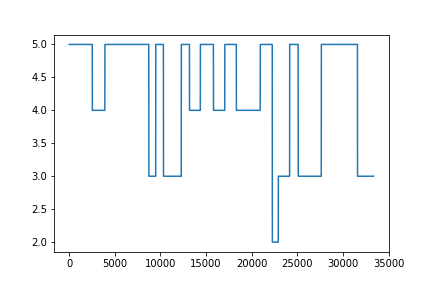

<function matplotlib.pyplot.show(*args, **kw)>

In [156]:
plt.figure(40)
plt.plot(range(len(data_0)), data_0.Part.values)#.hist()
plt.show

<IPython.core.display.Javascript object>


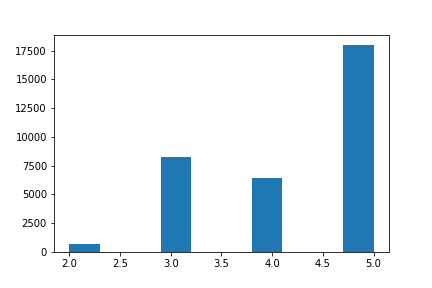

In [162]:
plt.figure(41)
plt.hist(data_0['Part'])
plt.show()

<IPython.core.display.Javascript object>


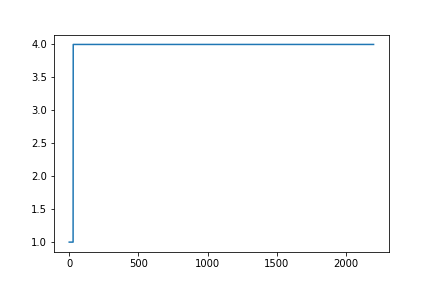

<function matplotlib.pyplot.show(*args, **kw)>

In [163]:
plt.figure(42)
plt.plot(range(len(data_1)), data_1.Part.values)#.hist()
plt.show

<IPython.core.display.Javascript object>


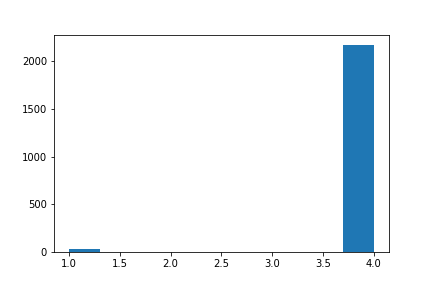

In [164]:
plt.figure(43)
plt.hist(data_1['Part'])
plt.show()

<IPython.core.display.Javascript object>


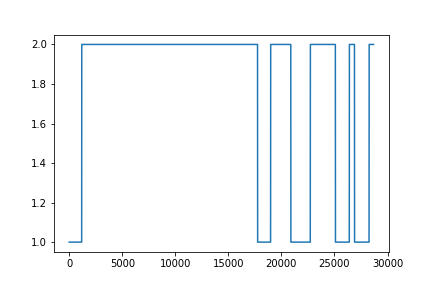

<function matplotlib.pyplot.show(*args, **kw)>

In [166]:
plt.figure(44)
plt.plot(range(len(data_2)), data_2.Part.values)#.hist()
plt.show

<IPython.core.display.Javascript object>


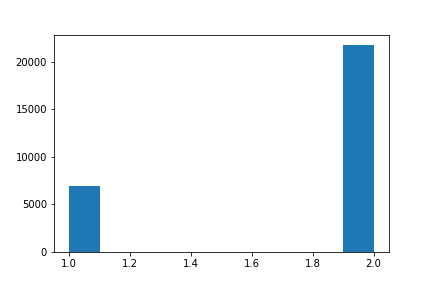

In [167]:
plt.figure(45)
plt.hist(data_2['Part'])
plt.show()

<IPython.core.display.Javascript object>


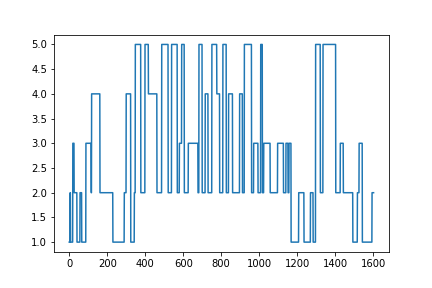

<function matplotlib.pyplot.show(*args, **kw)>

In [168]:
plt.figure(46)
plt.plot(range(len(data_3)), data_3.Part.values)#.hist()
plt.show

<IPython.core.display.Javascript object>


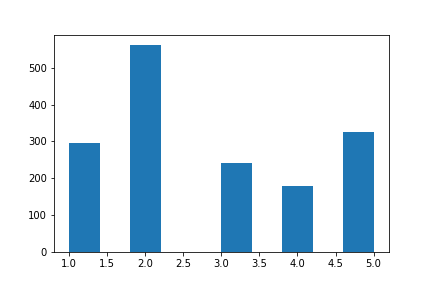

In [169]:
plt.figure(47)
plt.hist(data_3['Part'])
plt.show()

<IPython.core.display.Javascript object>


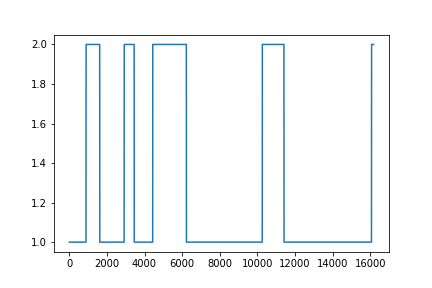

<function matplotlib.pyplot.show(*args, **kw)>

In [170]:
plt.figure(48)
plt.plot(range(len(data_4)), data_4.Part.values)#.hist()
plt.show

<IPython.core.display.Javascript object>


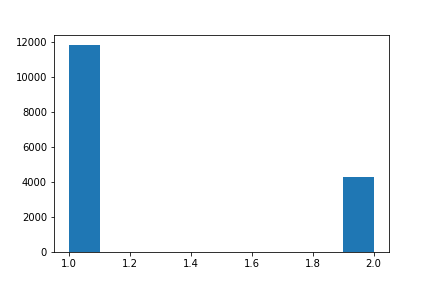

In [171]:
plt.figure(49)
plt.hist(data_4['Part'])
plt.show()

<IPython.core.display.Javascript object>


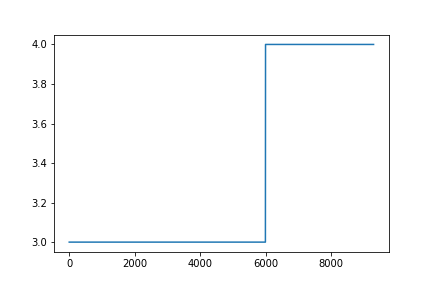

<function matplotlib.pyplot.show(*args, **kw)>

In [172]:
plt.figure(50)
plt.plot(range(len(data_5)), data_5.Part.values)#.hist()
plt.show

<IPython.core.display.Javascript object>


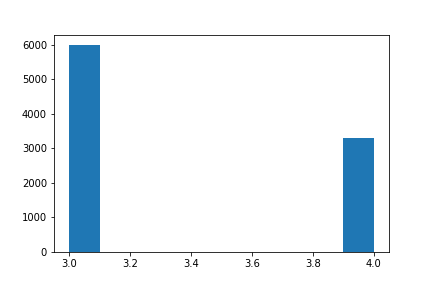

In [173]:
plt.figure(51)
plt.hist(data_5['Part'])
plt.show()

<IPython.core.display.Javascript object>


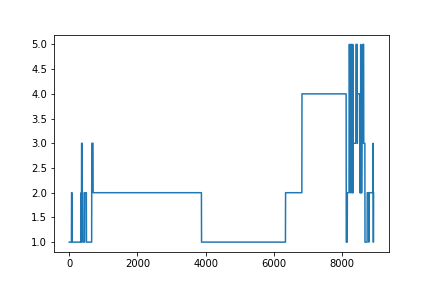

<function matplotlib.pyplot.show(*args, **kw)>

In [174]:
plt.figure(52)
plt.plot(range(len(data_6)), data_6.Part.values)#.hist()
plt.show

<IPython.core.display.Javascript object>


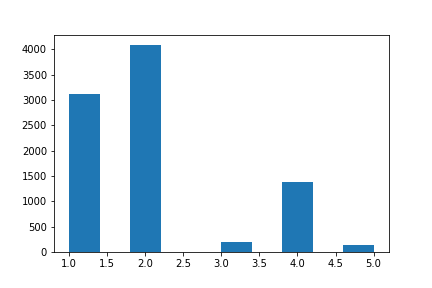

In [175]:
plt.figure(53)
plt.hist(data_6['Part'])
plt.show()

<IPython.core.display.Javascript object>


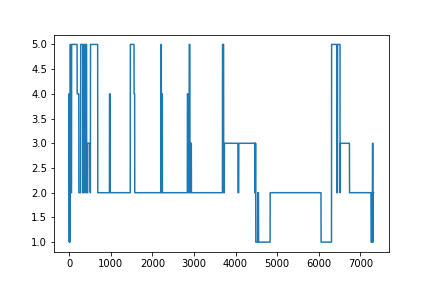

<function matplotlib.pyplot.show(*args, **kw)>

In [176]:
plt.figure(54)
plt.plot(range(len(data_7)), data_7.Part.values)#.hist()
plt.show

<IPython.core.display.Javascript object>


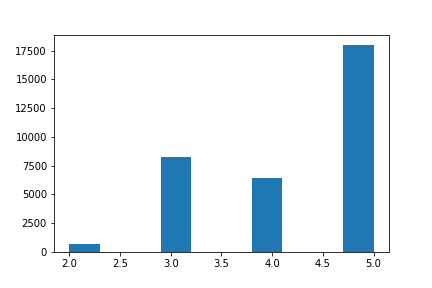

In [162]:
plt.figure(55)
plt.hist(data_7['Part'])
plt.show()

In [121]:
np.unique(data_1['Part'])

array(['B1012-278-1', 'B1012-278-4'], dtype=object)

In [122]:
np.unique(data_2['Part'])

array(['B1012-278-1', 'B1022-278-1'], dtype=object)

In [123]:
np.unique(data_3['Part'])

array(['B1012-278-1', 'B1012-278-2', 'B1012-278-3', 'B1012-278-4',
       'B1022-278-1'], dtype=object)

In [124]:
np.unique(data_4['Part'])

array(['B1012-278-1', 'B1022-278-1'], dtype=object)

In [125]:
np.unique(data_5['Part'])

array(['B1012-278-3', 'B1012-278-4'], dtype=object)

In [126]:
np.unique(data_6['Part'])

array(['B1012-278-1', 'B1012-278-2', 'B1012-278-3', 'B1012-278-4',
       'B1022-278-1'], dtype=object)

In [127]:
np.unique(data_7['Part'])

array(['B1012-278-1', 'B1012-278-2', 'B1012-278-3', 'B1012-278-4',
       'B1022-278-1'], dtype=object)

In [119]:
n_clusters_ = len(np.unique(df['cluster_label']))
defect_rates = [0 for x in range(n_clusters_)]
for i in range(n_clusters_):
    temp_df = df[ (df['cluster_label']==float(i)) ]
    defect_cluster = temp_df[  (temp_df['defect'] == 1) ]
    defect_rate = len(defect_cluster) / len(temp_df)
    defect_rates[i] = float("{:.2f}".format(defect_rate*100))  
    
print(defect_rates)

[1.56, 0.0, 2.27, 1.37, 4.85, 2.43, 2.39, 2.55]


In [93]:
n_clusters_ = len(np.unique(df['cluster_label']))
cluster_sizes = [0 for x in range(n_clusters_)]
for i in range(n_clusters_):
    temp_df = df[ (df['cluster_label']==float(i)) ]
    cluster_sizes[i] = len(temp_df)
    
print(cluster_sizes)

[33358, 2201, 28688, 1603, 16172, 9300, 8927, 7320]


(33358, 279)


<IPython.core.display.Javascript object>


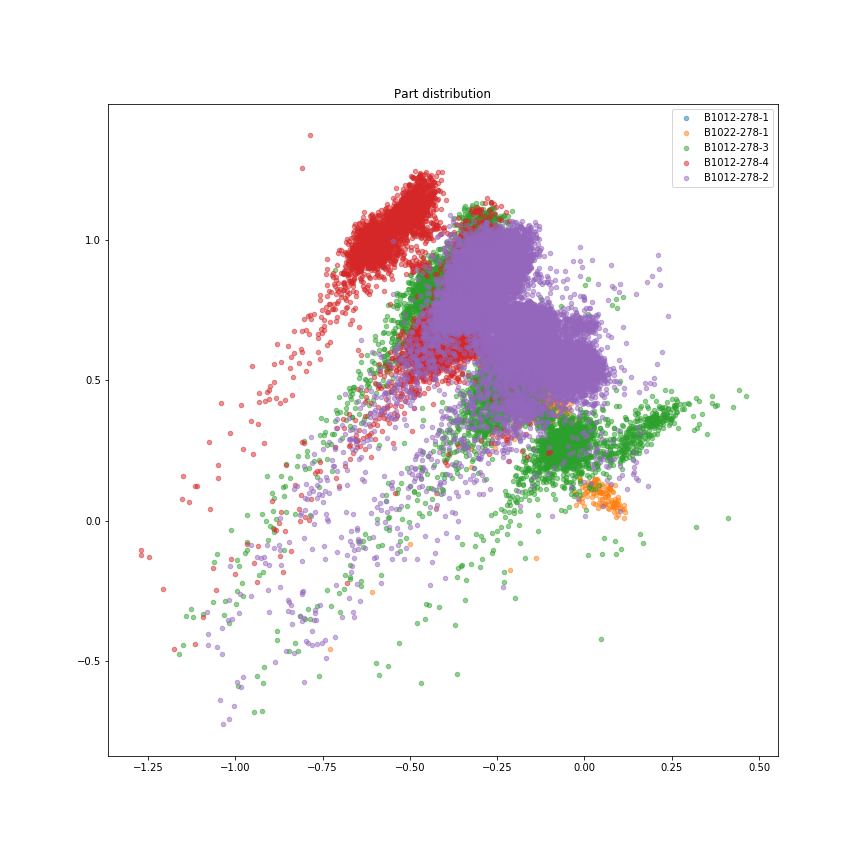

In [179]:
print(data_0.shape)
plot_targets(data_0)

(2201, 282)


<IPython.core.display.Javascript object>


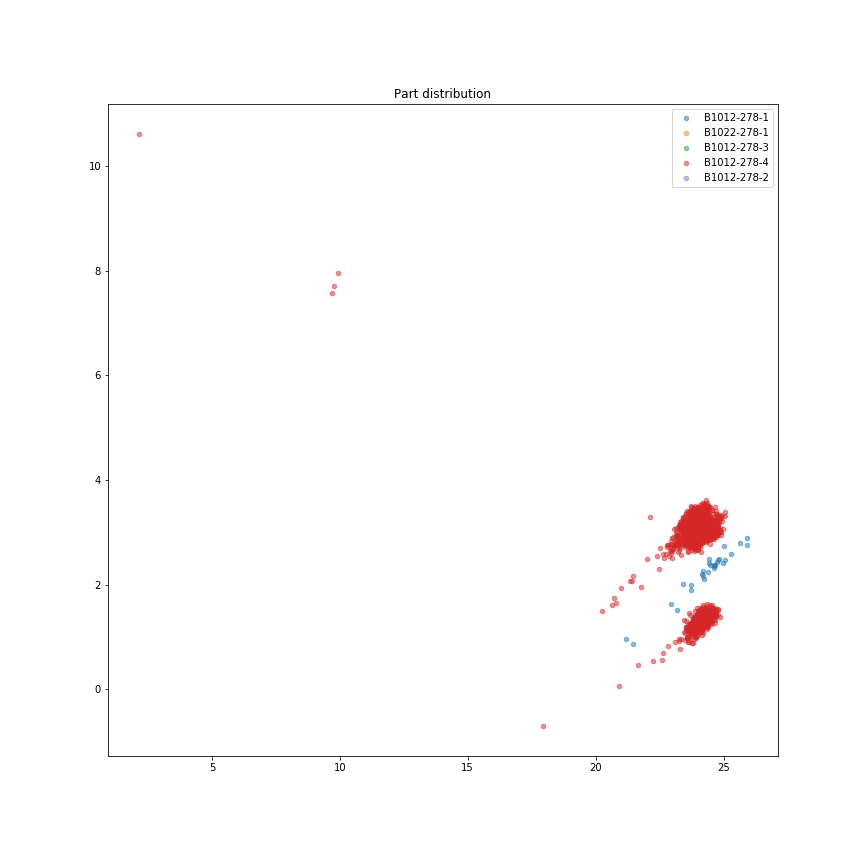

In [114]:
print(data_1.shape)
plot_targets(data_1)

(28688, 279)


<IPython.core.display.Javascript object>


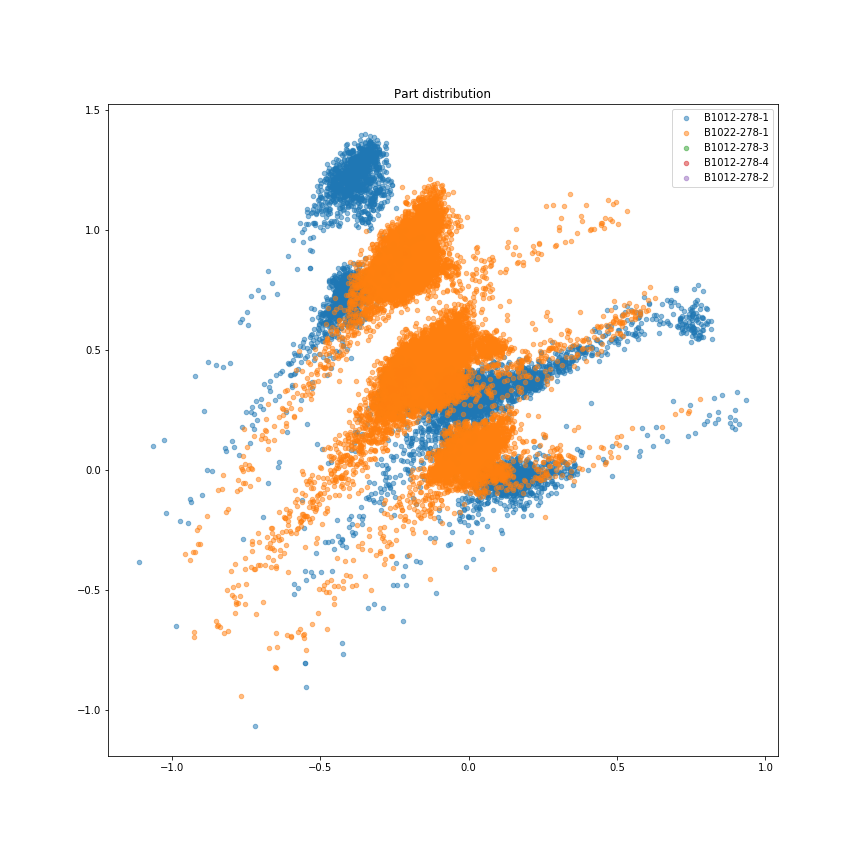

In [180]:
print(data_2.shape)
plot_targets(data_2)

(1603, 282)


<IPython.core.display.Javascript object>


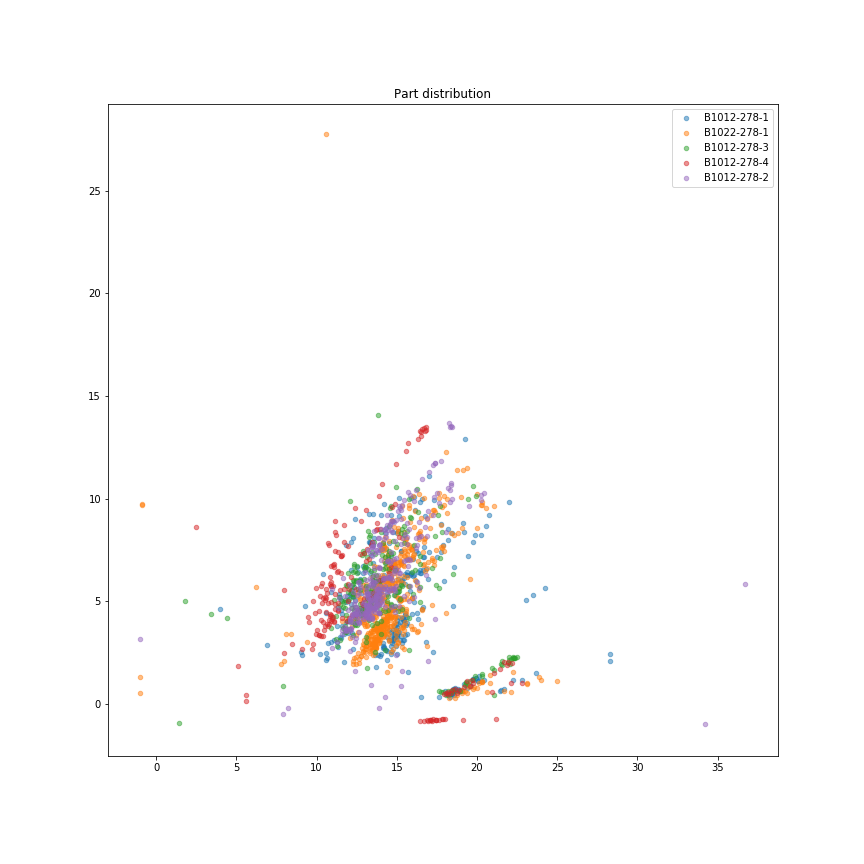

In [118]:
print(data_3.shape)
plot_targets(data_3)

(16172, 279)


<IPython.core.display.Javascript object>


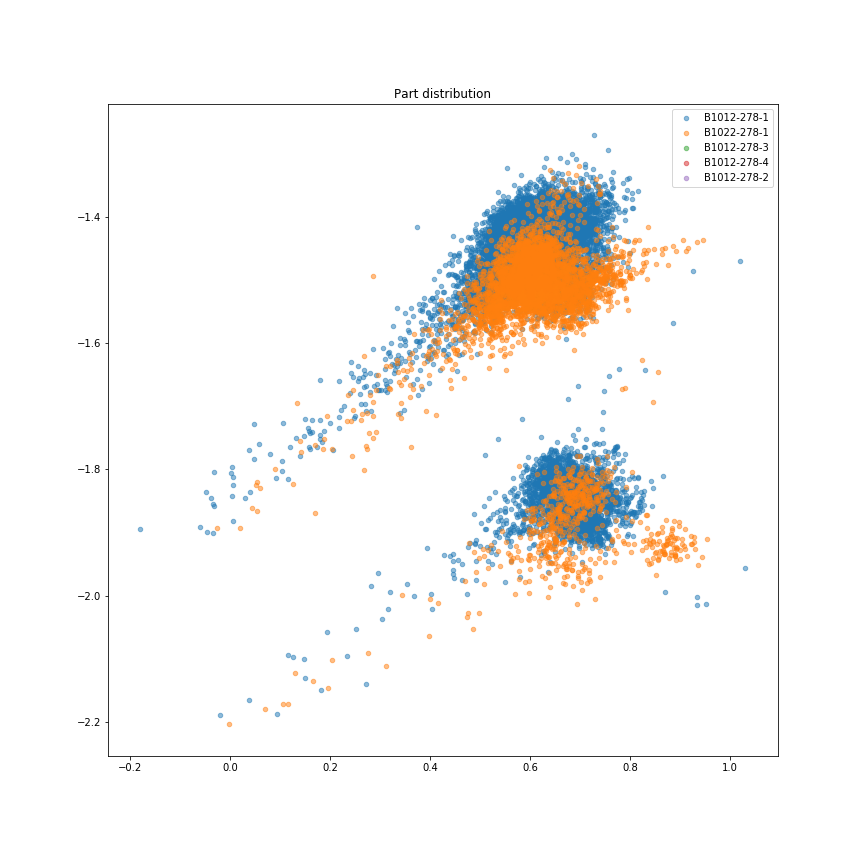

In [181]:
print(data_4.shape)
plot_targets(data_4)

(9300, 282)


<IPython.core.display.Javascript object>


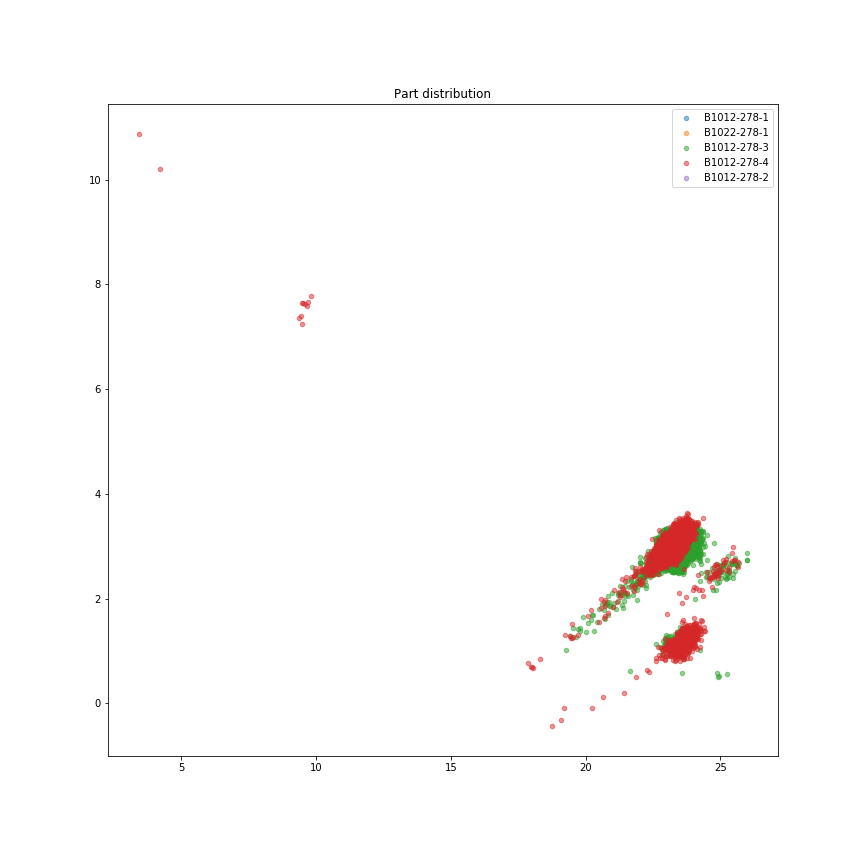

In [120]:
print(data_5.shape)
plot_targets(data_5)

(8927, 279)


<IPython.core.display.Javascript object>


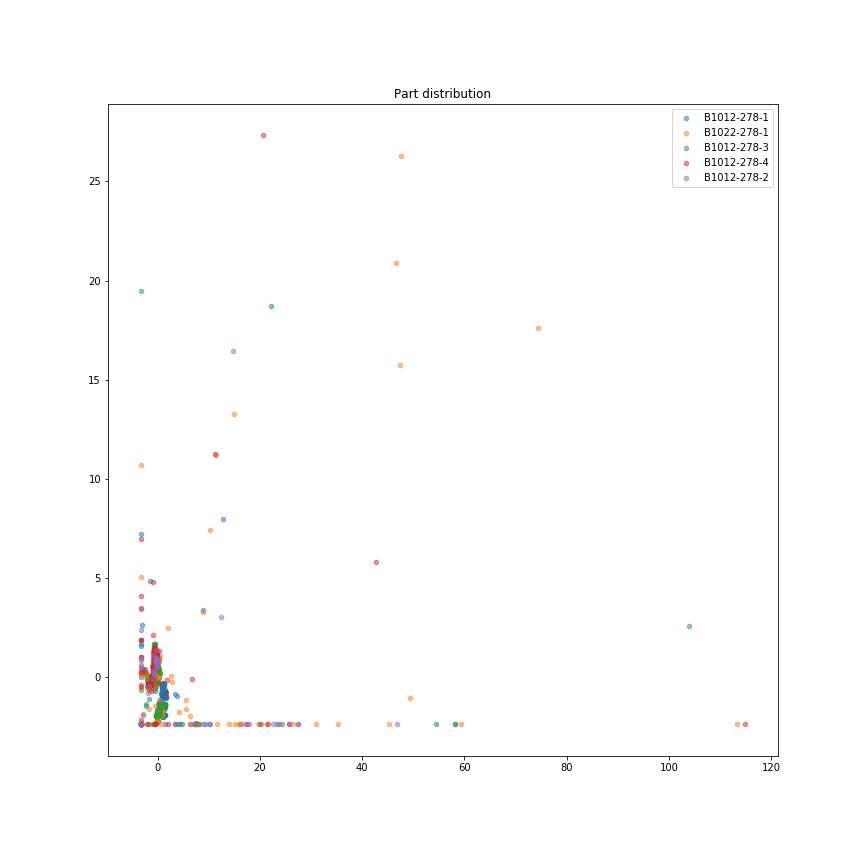

In [182]:
print(data_6.shape)
plot_targets(data_6)

(2201, 282)


<IPython.core.display.Javascript object>


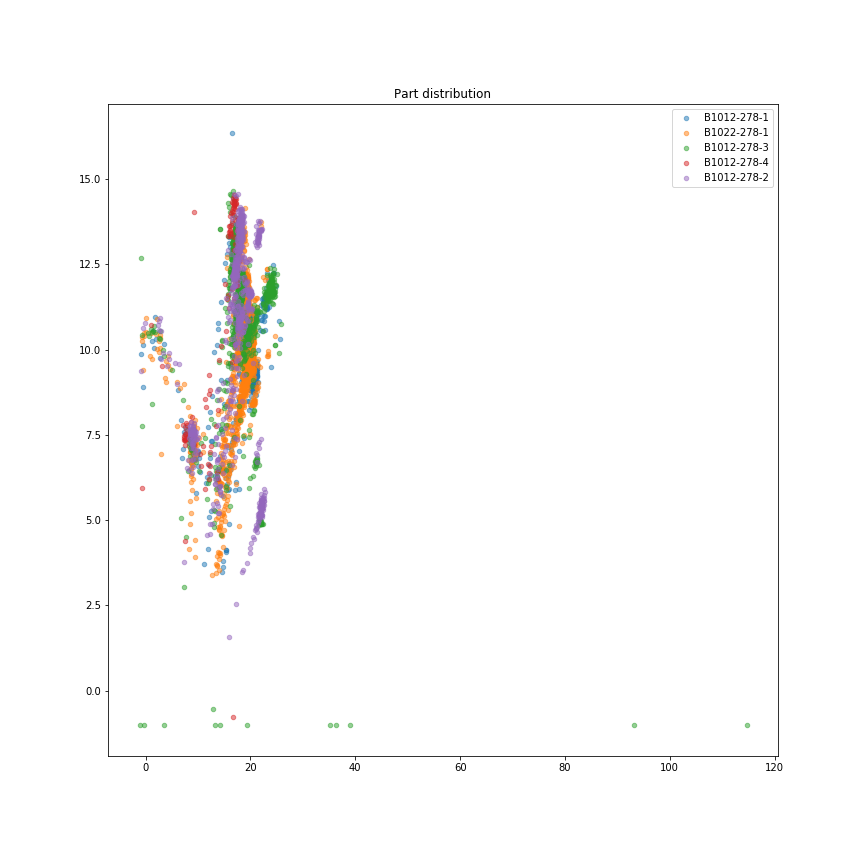

In [121]:
print(data_1.shape)
plot_targets(data_7)

<IPython.core.display.Javascript object>


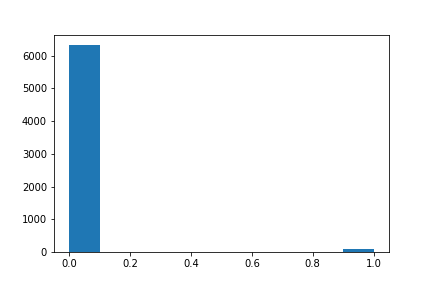

(array([6331.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,
         104.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <a list of 10 Patch objects>)

In [228]:
#part2_clus0_df = 
plt.figure(60)
#plt.scatter(range(len(data_0[(data_0['Part']==2)].defect.values)), data_0[(data_0['Part']==2)].defect.values)
plt.hist(data_0[(data_0['Part']==4)].defect.values)

<IPython.core.display.Javascript object>


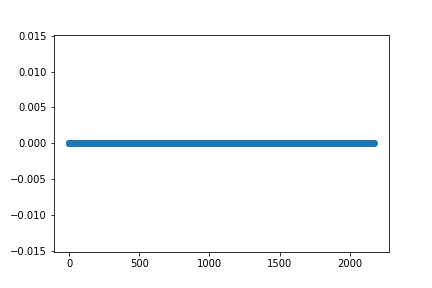

In [200]:
#part2_clus0_df = 
plt.figure(61)
plt.scatter(range(len(data_1[(data_1['Part']==4)].defect.values)), data_1[(data_1['Part']==4)].defect.values)
#plt.hist(data_1[(data_1['Part']==4)].defect.values)

<IPython.core.display.Javascript object>


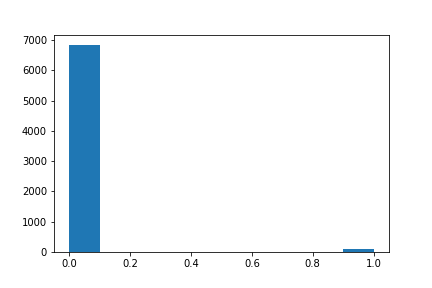

(array([6836.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,
          95.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <a list of 10 Patch objects>)

In [210]:
#part2_clus0_df = 
plt.figure(62)
#plt.scatter(range(len(data_0[(data_0['Part']==2)].defect.values)), data_0[(data_0['Part']==2)].defect.values)
plt.hist(data_2[(data_2['Part']==1)].defect.values)

<IPython.core.display.Javascript object>


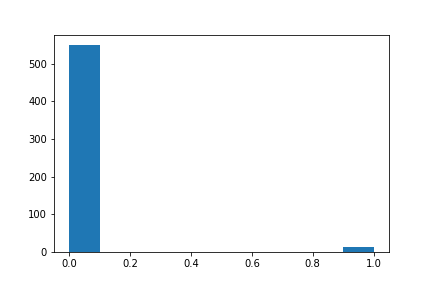

(array([550.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,  12.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <a list of 10 Patch objects>)

In [230]:
#part2_clus0_df = 
plt.figure(63)
#plt.scatter(range(len(data_0[(data_0['Part']==2)].defect.values)), data_0[(data_0['Part']==2)].defect.values)
plt.hist(data_3[(data_3['Part']==2)].defect.values)

<IPython.core.display.Javascript object>


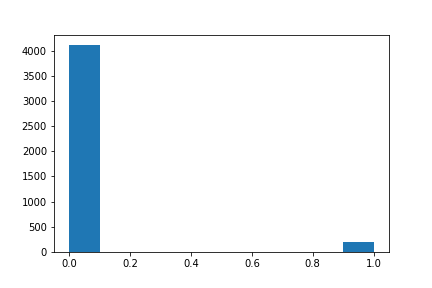

(array([4111.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,
         202.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <a list of 10 Patch objects>)

In [219]:
#part2_clus0_df = 
plt.figure(64)
#plt.scatter(range(len(data_0[(data_0['Part']==2)].defect.values)), data_0[(data_0['Part']==2)].defect.values)
plt.hist(data_4[(data_4['Part']==2)].defect.values)

<IPython.core.display.Javascript object>


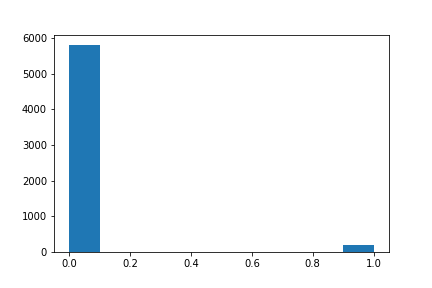

(array([5807.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,
         188.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <a list of 10 Patch objects>)

In [221]:
#part2_clus0_df = 
plt.figure(65)
#plt.scatter(range(len(data_0[(data_0['Part']==2)].defect.values)), data_0[(data_0['Part']==2)].defect.values)
plt.hist(data_5[(data_5['Part']==3)].defect.values)

<IPython.core.display.Javascript object>


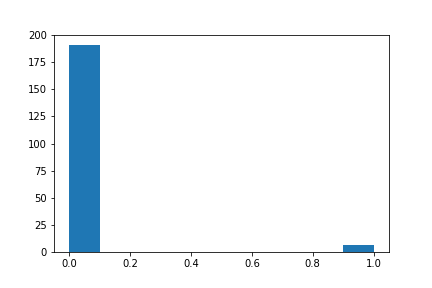

(array([191.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   6.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <a list of 10 Patch objects>)

In [223]:
#part2_clus0_df = 
plt.figure(66)
#plt.scatter(range(len(data_0[(data_0['Part']==2)].defect.values)), data_0[(data_0['Part']==2)].defect.values)
plt.hist(data_6[(data_6['Part']==3)].defect.values)

<IPython.core.display.Javascript object>


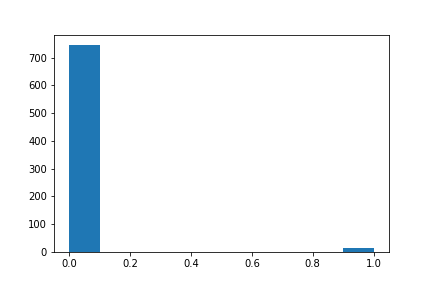

(array([746.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,  13.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <a list of 10 Patch objects>)

In [227]:
#part2_clus0_df = 
plt.figure(67)
#plt.scatter(range(len(data_0[(data_0['Part']==2)].defect.values)), data_0[(data_0['Part']==2)].defect.values)
plt.hist(data_7[(data_7['Part']==5)].defect.values)

In [99]:
part_1_df = df_scaled[df_scaled['Part'] == 1]
part_2_df = df_scaled[df_scaled['Part'] == 2]
part_3_df = df_scaled[df_scaled['Part'] == 3]
part_4_df = df_scaled[df_scaled['Part'] == 4]
part_5_df = df_scaled[df_scaled['Part'] == 5]

In [100]:
part_perform = [0 for x in range(5)]
part_perform[0] = len(part_1_df[part_1_df['defect'] == 1])/len(part_1_df)*100
part_perform[1] = len(part_2_df[part_2_df['defect'] == 1])/len(part_2_df)*100
part_perform[2] = len(part_3_df[part_3_df['defect'] == 1])/len(part_3_df)*100
part_perform[3] = len(part_4_df[part_4_df['defect'] == 1])/len(part_4_df)*100
part_perform[4] = len(part_5_df[part_5_df['defect'] == 1])/len(part_5_df)*100

In [101]:
part_perform

[3.2941073537775054,
 2.910338340664509,
 2.1915893787320546,
 1.3754045307443366,
 1.3940182054616386]

<IPython.core.display.Javascript object>


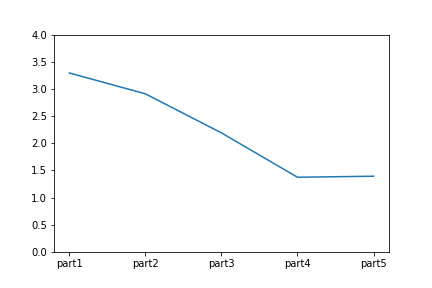

(0, 4)

In [102]:
plt.figure(70)
plt.plot(['part1','part2','part3','part4','part5',], part_perform)
plt.ylim(0, 4)

In [103]:
part_lens = [0 for x in range(5)]
part_lens[0] = len(part_1_df)
part_lens[1] = len(part_2_df)
part_lens[2] = len(part_3_df)
part_lens[3] = len(part_4_df)
part_lens[4] = len(part_5_df)

<IPython.core.display.Javascript object>


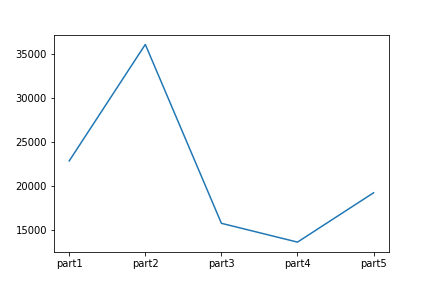

In [104]:
plt.figure(71)
plt.plot(['part1','part2','part3','part4','part5',], part_lens)
#plt.ylim(0, 0.04)

<IPython.core.display.Javascript object>


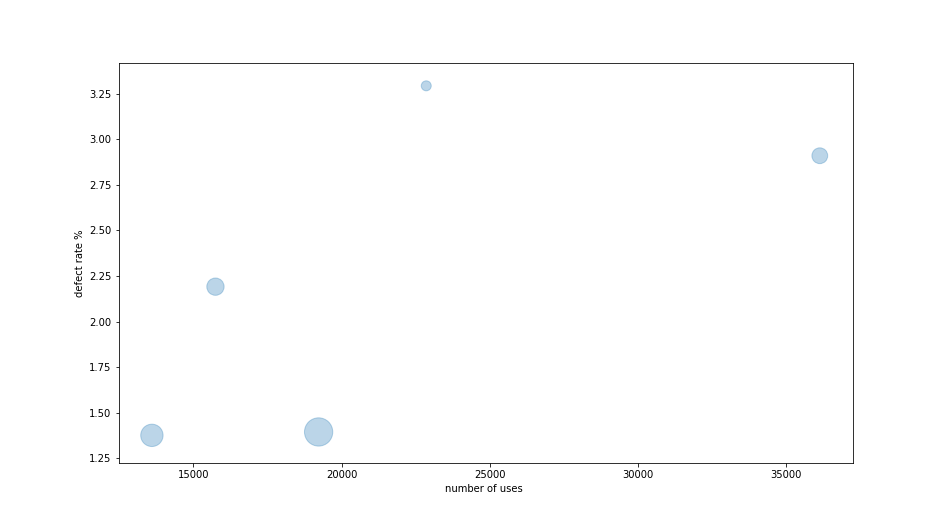

Text(0, 0.5, 'defect rate %')

In [134]:
rng = np.random.RandomState(0)

plt.figure(72)
#plt.scatter(part_lens, part_perform)
plt.scatter(part_lens, part_perform, s=[100, 250, 300, 500, 800], alpha=0.3,
            cmap='viridis')
plt.xlabel('number of uses ')
plt.ylabel('defect rate %')
